In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Load data
df_stim = pd.read_pickle('activdata/srg/zap_zip/mouse569062/estim_vis_2021-02-18_11-17-51/meta_stim')
df_probeB_spikes = pd.read_pickle('activdata/srg/zap_zip/mouse569062/estim_vis_2021-02-18_11-17-51/probeB_spikes')
meta_units = pd.read_pickle('activdata/srg/zap_zip/mouse569062/estim_vis_2021-02-18_11-17-51/meta_units').loc['probeB']
neuron_regions = meta_units['area']


In [11]:
neuron_regions.unique()

array(['VPM', 'PO', 'LD', 'CA3', 'CA1', 'alv', 'ccb', 'cing', 'SSp-ll6b',
       'SSp-ll6a', 'SSp-tr6a', 'SSp-tr5', 'SSp-tr4', 'SSp-tr2/3'],
      dtype=object)

In [6]:
df_stim

,stim_type,parameter,onset,offset,duration,sweep
0,biphasic,35,310.40707,310.40747,0.00040,0
1,biphasic,15,313.94009,313.94049,0.00040,0
2,biphasic,35,318.00171,318.00211,0.00040,0
3,biphasic,60,322.38399,322.38439,0.00040,0
4,biphasic,60,326.55359,326.55399,0.00040,0
...,...,...,...,...,...,...
1435,circle,white,7698.41097,7698.66039,0.24942,2
1436,circle,white,7702.86468,7703.11413,0.24945,2
1437,circle,white,7707.03484,7707.28430,0.24946,2
1438,circle,white,7711.48856,7711.73804,0.24948,2


In [7]:
df_probeB_spikes

units,2,9,14,15,17,18,19,20,22,27,...,717,718,720,722,723,724,725,726,728,729
time,,,,,,,,,,,,,,,,,,,,,
4.429,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4.430,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4.431,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4.432,False,False,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
4.433,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745.634,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
7745.635,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
7745.636,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [15]:
# Define depth order of brain regions
depth_order = ['VPM', 'PO', 'LD', 'CA3', 'CA1', 'alv', 'ccb', 'cing', 'SSp-ll6b',
       'SSp-ll6a', 'SSp-tr6a', 'SSp-tr5', 'SSp-tr4', 'SSp-tr2/3'][::-1]


In [16]:

# Convert region labels to categorical data using depth order and sort neurons
region_sorted = pd.Categorical(neuron_regions, categories=depth_order, ordered=True)
region_sorted_indices = np.argsort(region_sorted.codes)

# Define time window, bin size, and bins for analysis
window_start, window_end, bin_size = -200, 600, 10
num_bins = int((window_end - window_start) / bin_size)
time_bins = np.linspace(window_start, window_end, num_bins)

# Filter for 'biphasic' stimuli and get parameters and sweeps
df_biphasic = df_stim[df_stim['stim_type'] == 'biphasic']
parameters = np.sort(df_biphasic['parameter'].unique())
sweeps = np.sort(df_biphasic['sweep'].unique())
sweep_labels = {0: 'Awake', 1: 'ISO', 2: 'Recovery '}


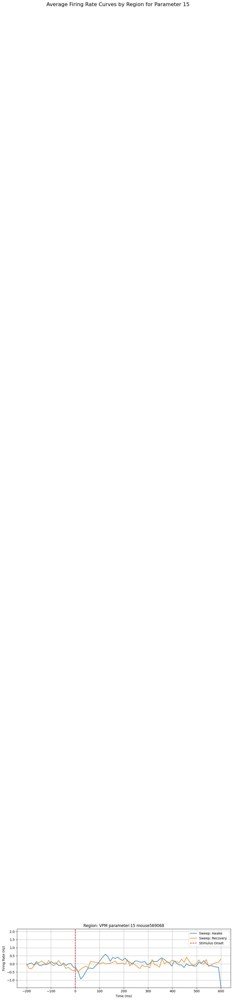

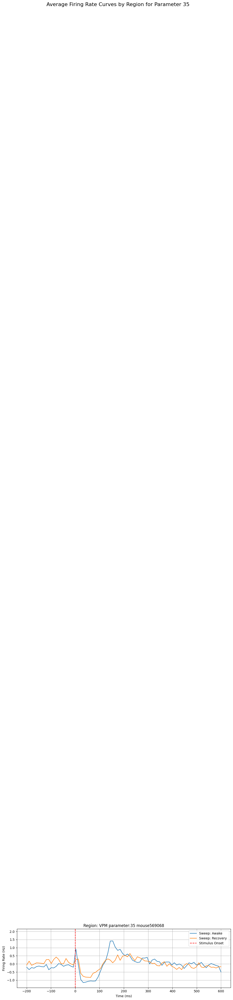

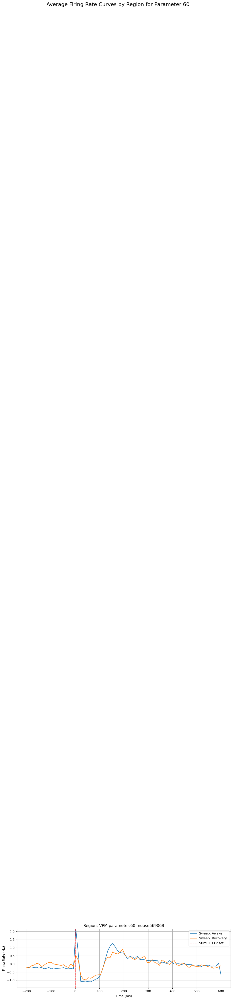

In [17]:
# Initialize dictionary to store firing rates for each region, parameter, and sweep
average_firing_rates = {region: {param: {} for param in parameters} for region in depth_order}

# Calculate firing rate matrices by region, parameter, and sweep
for param in parameters:
    for sweep in sweeps:
        df_param_sweep = df_biphasic[(df_biphasic['parameter'] == param) & (df_biphasic['sweep'] == sweep)]
        
        for region in depth_order:
            neuron_indices = [idx for idx, r in enumerate(region_sorted) if r == region]
            neuron_firing_rates = []
            
            for neuron_idx in neuron_indices:
                if neuron_idx < df_probeB_spikes.shape[1]:  # Ensure index is within bounds
                    spike_times = df_probeB_spikes.index[df_probeB_spikes.iloc[:, neuron_idx]]
                    neuron_responses = []
                    
                    for _, stim_row in df_param_sweep.iterrows():
                        onset_time = stim_row['onset']
                        bins = np.arange(onset_time + window_start / 1000, onset_time + window_end / 1000, bin_size / 1000)
                        binned_spikes, _ = np.histogram(spike_times, bins=bins)
                        binned_spikes = np.pad(binned_spikes, (0, num_bins - len(binned_spikes)), 'constant') if len(binned_spikes) < num_bins else binned_spikes[:num_bins]
                        neuron_responses.append(binned_spikes)
                    
                    if neuron_responses:  # Check if there were any responses to the stimulus
                        neuron_responses = np.array(neuron_responses)
                        average_response = np.mean(neuron_responses, axis=0)
                        z_scored_response = np.clip(zscore(average_response), -3, 3)  # Z-score and clip
                        neuron_firing_rates.append(z_scored_response)
                
            if neuron_firing_rates:
                firing_rate_matrix = np.array(neuron_firing_rates)
                mean_firing_rate_across_neurons = np.mean(firing_rate_matrix, axis=0)
                average_firing_rates[region][param][sweep] = mean_firing_rate_across_neurons

# Determine global y-axis limits based on all data
all_firing_rates = [
    firing_rate for region_data in average_firing_rates.values() 
    for param_data in region_data.values() 
    for firing_rate in param_data.values()
]

y_min, y_max = np.nanmin(all_firing_rates), np.nanmax(all_firing_rates)
if not np.isfinite(y_min) or not np.isfinite(y_max):  # Default if no finite values
    y_min, y_max = -3, 3

# Plotting: Separate plots for each parameter, with sweeps displayed in each
for param in parameters:
    fig, axs = plt.subplots(len(depth_order), figsize=(10, 3 * len(depth_order)), sharex=True)
    fig.suptitle(f'Average Firing Rate Curves by Region for Parameter {param}', fontsize=16, y=1.02)
    
    # Track which subplots have data
    visible_plots = []

    for i, region in enumerate(depth_order):
        if region in average_firing_rates and param in average_firing_rates[region]:
            any_data = False
            for sweep, firing_rate in average_firing_rates[region][param].items():
                if np.any(np.isfinite(firing_rate)):  # Check if the firing rate data is valid
                    axs[i].plot(time_bins, firing_rate, label=f'Sweep: {sweep_labels[sweep]}')
                    any_data = True
                
            if any_data:
                # Apply global y-axis limits and styling to each subplot
                axs[i].axvline(0, color='red', linestyle='--', label='Stimulus Onset')  # Mark stimulus onset
                axs[i].set_ylim(y_min, y_max)
                axs[i].set_ylabel('Firing Rate (Hz)')
                axs[i].set_title(f'Region: {region} parameter:{param} mouse569068')
                axs[i].legend(loc='upper right')
                axs[i].grid(True)
                axs[i].set_xlabel('Time (ms)')
                visible_plots.append(i)  # Mark this plot as having data
            else:
                axs[i].set_visible(False)  # Hide the plot if there is no data for that region

        else:
            axs[i].set_visible(False)  # Hide the plot if no data for that region and parameter

    # Remove empty subplots from the figure
    visible_plots = np.array(visible_plots)
    axs = axs[visible_plots]  # Only keep subplots with data

    # Final adjustments for the entire figure
    axs[-1].set_xlabel('Time (ms)')
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()


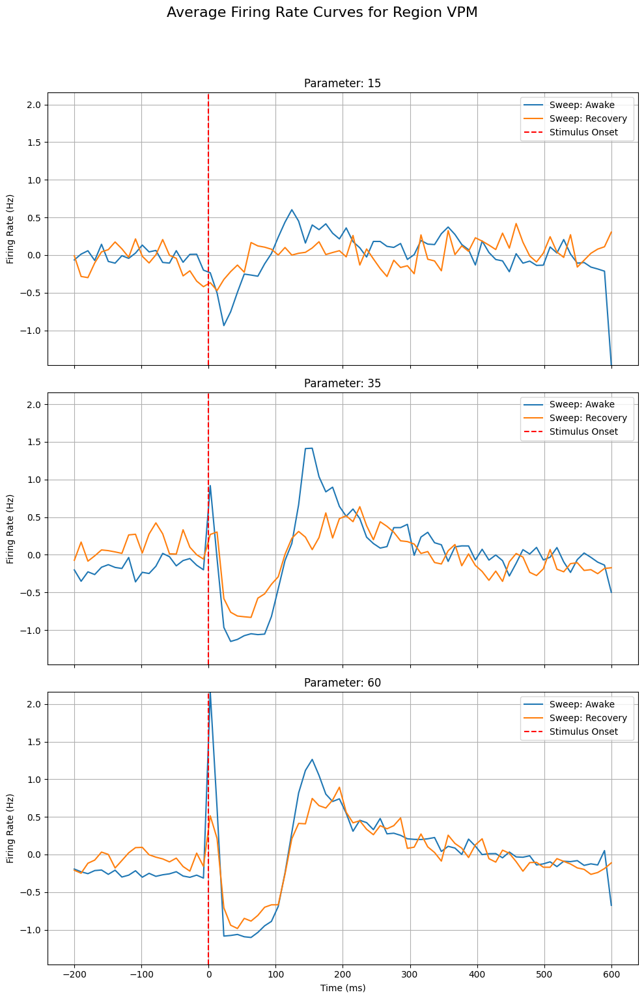

In [18]:
# Plotting: Separate plots for each region
for region in depth_order:
    if region in average_firing_rates:  # Ensure region exists in the dictionary
        region_has_data = any(
            np.any(np.isfinite(firing_rate))
            for param_data in average_firing_rates[region].values()
            for firing_rate in param_data.values()
        )
        if not region_has_data:
            continue  # Skip this region if it has no data

        fig, axs = plt.subplots(len(parameters), figsize=(10, 5 * len(parameters)), sharex=True)
        fig.suptitle(f'Average Firing Rate Curves for Region {region}', fontsize=16, y=1.02)

        for i, param in enumerate(parameters):
            if param in average_firing_rates[region]:
                any_data = False
                for sweep, firing_rate in average_firing_rates[region][param].items():
                    if np.any(np.isfinite(firing_rate)):  # Check if the firing rate data is valid
                        axs[i].plot(time_bins, firing_rate, label=f'Sweep: {sweep_labels[sweep]}')
                        any_data = True

                if any_data:
                    axs[i].axvline(0, color='red', linestyle='--', label='Stimulus Onset')  # Stimulus onset
                    axs[i].set_ylim(y_min, y_max)
                    axs[i].set_ylabel('Firing Rate (Hz)')
                    axs[i].set_title(f'Parameter: {param}')
                    axs[i].legend(loc='upper right')
                    axs[i].grid(True)
                else:
                    axs[i].set_visible(False)  # Hide subplot if no data for this parameter

        axs[-1].set_xlabel('Time (ms)')  # Add x-label only to the last subplot
        plt.tight_layout(rect=[0, 0, 1, 0.98])
        plt.show()


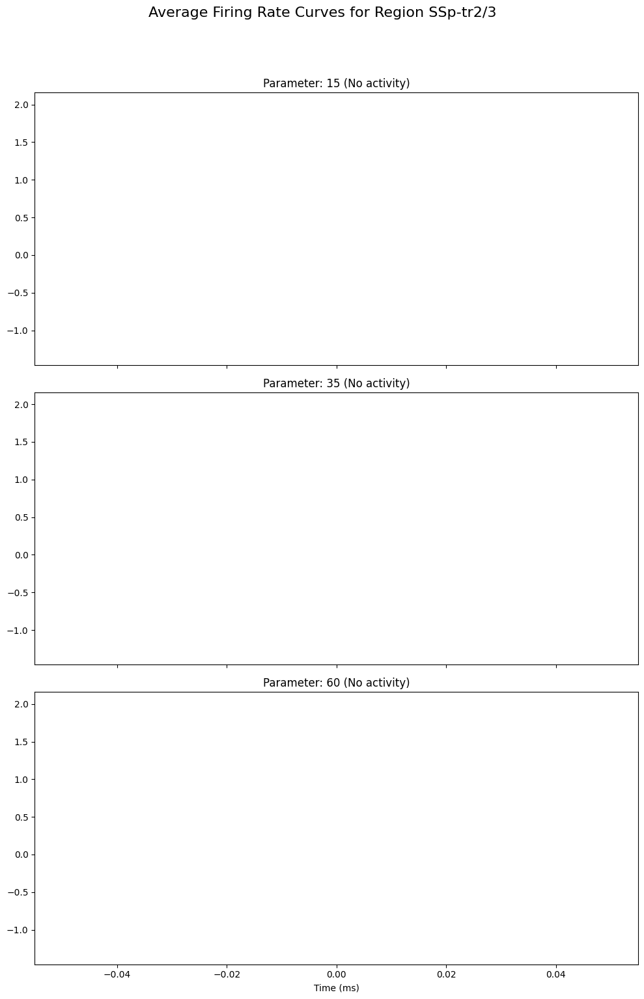

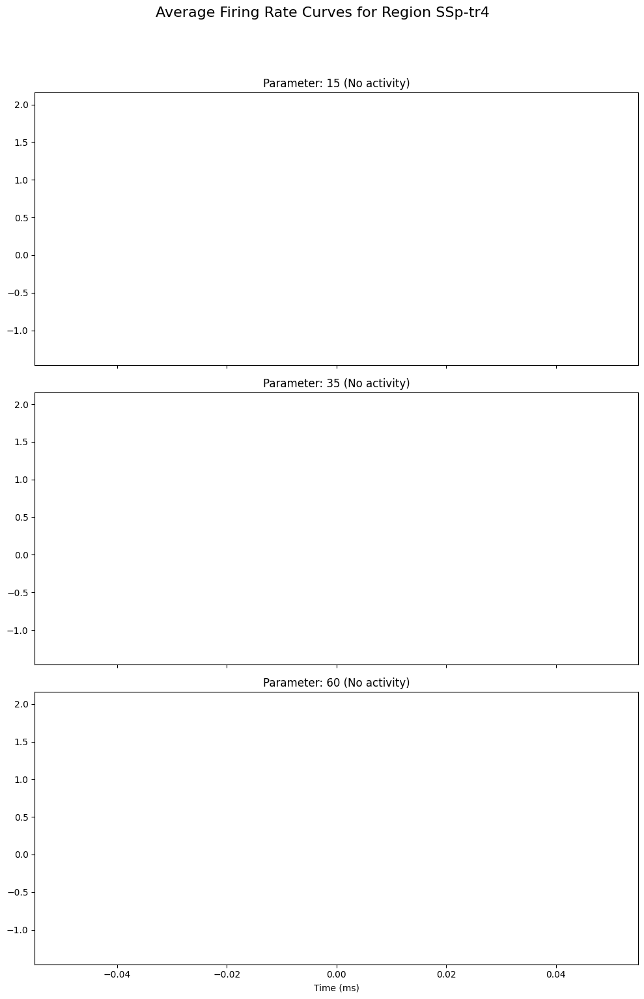

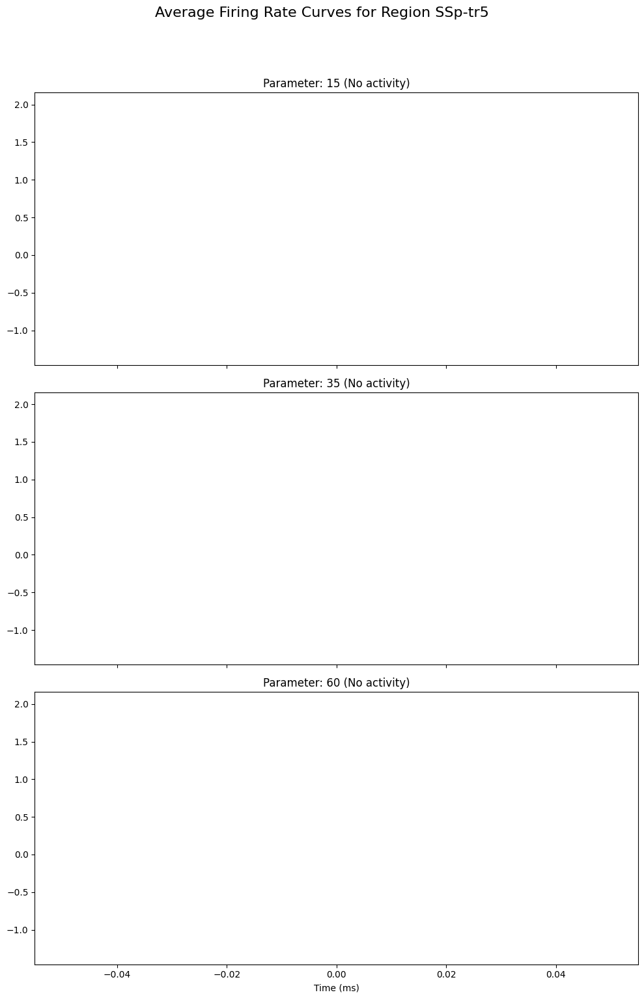

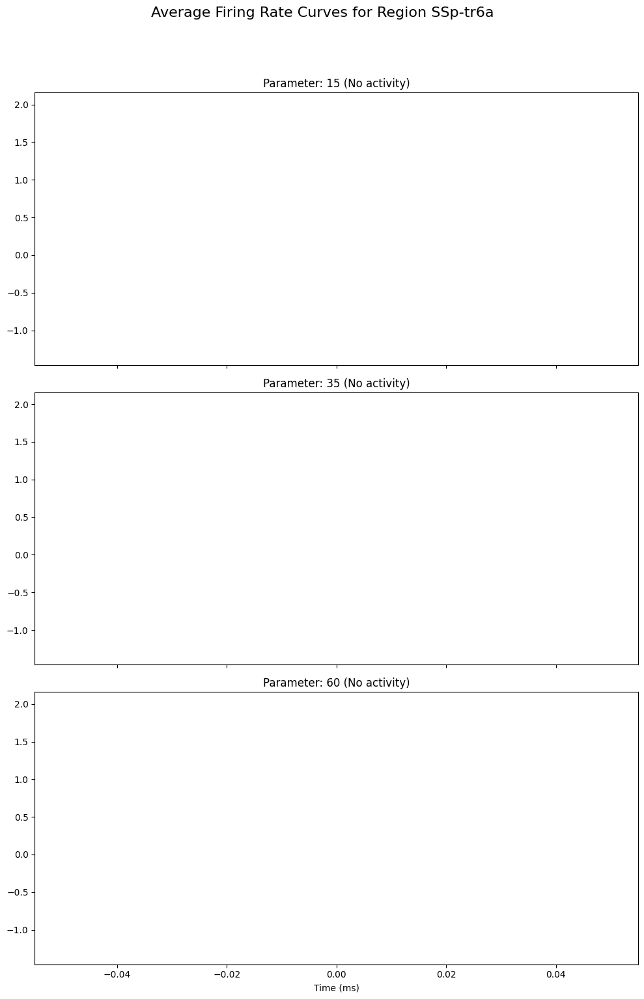

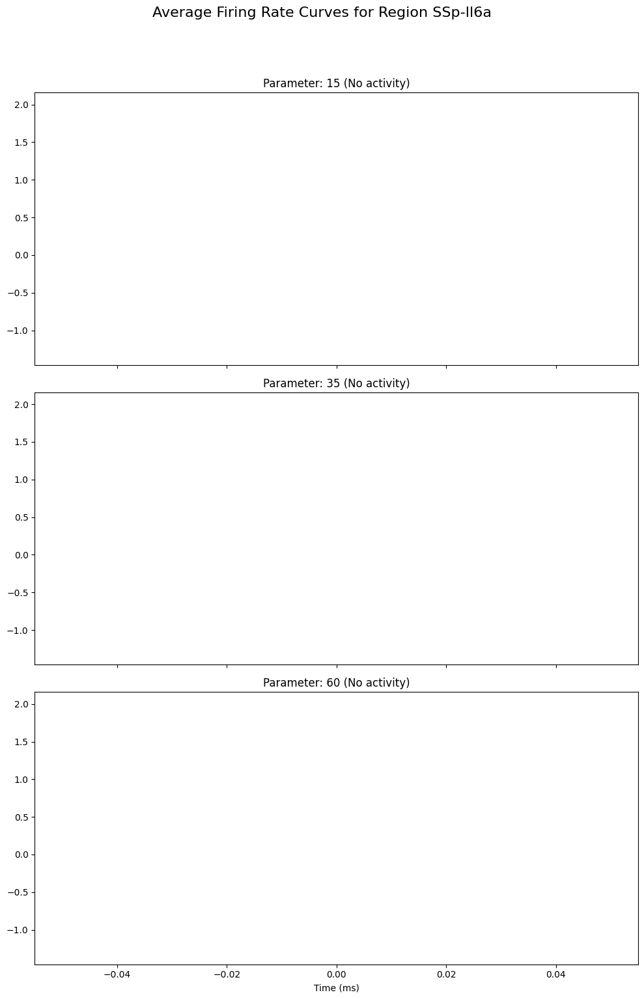

...

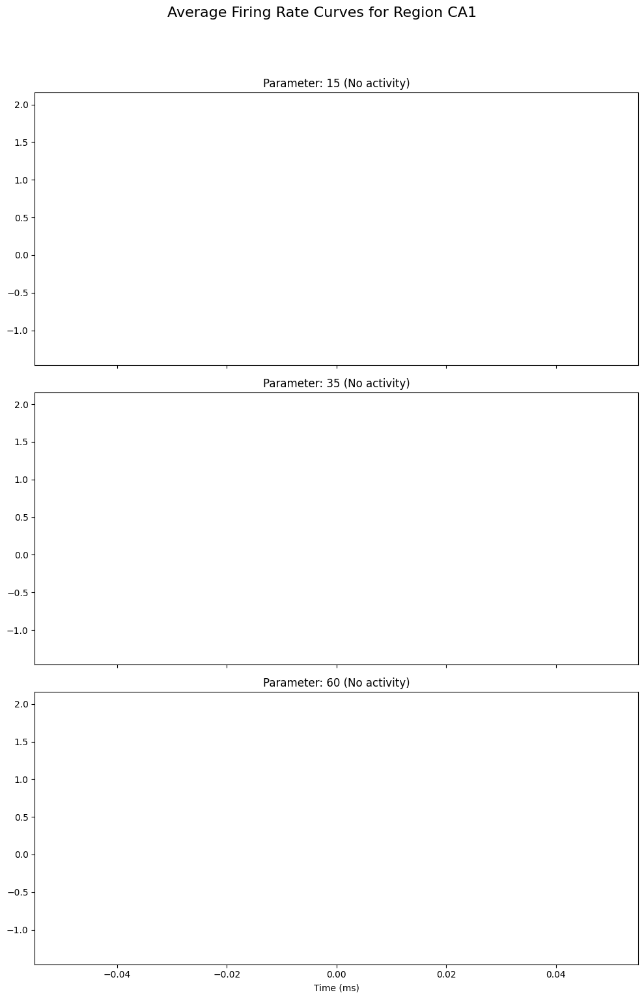

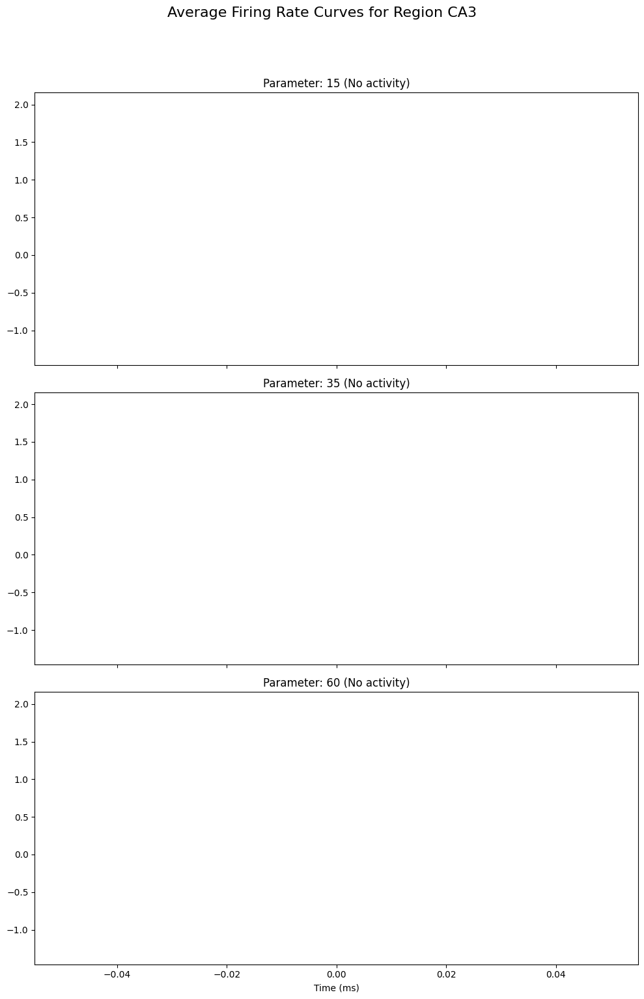

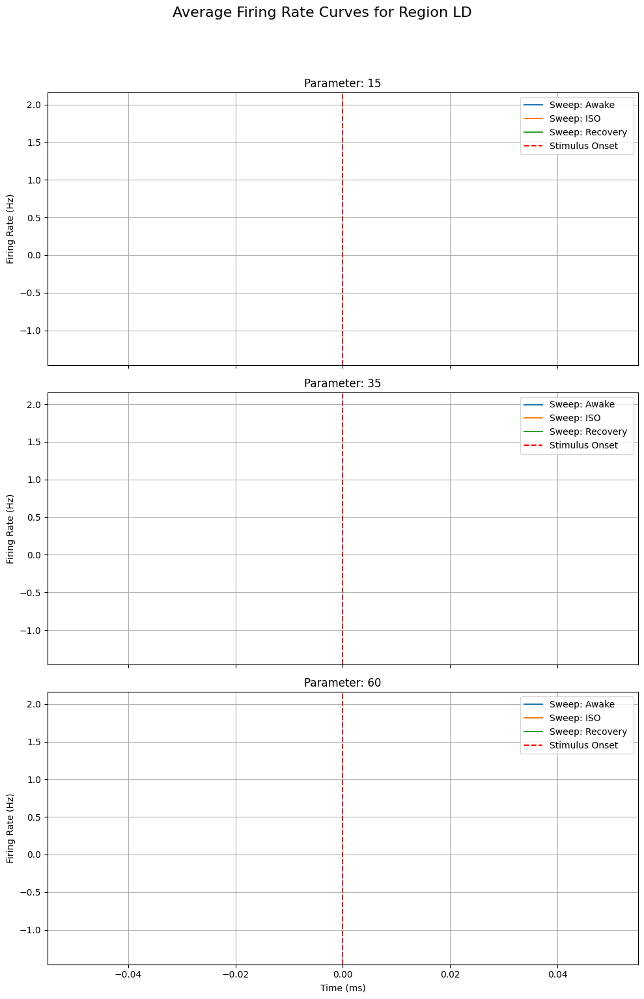

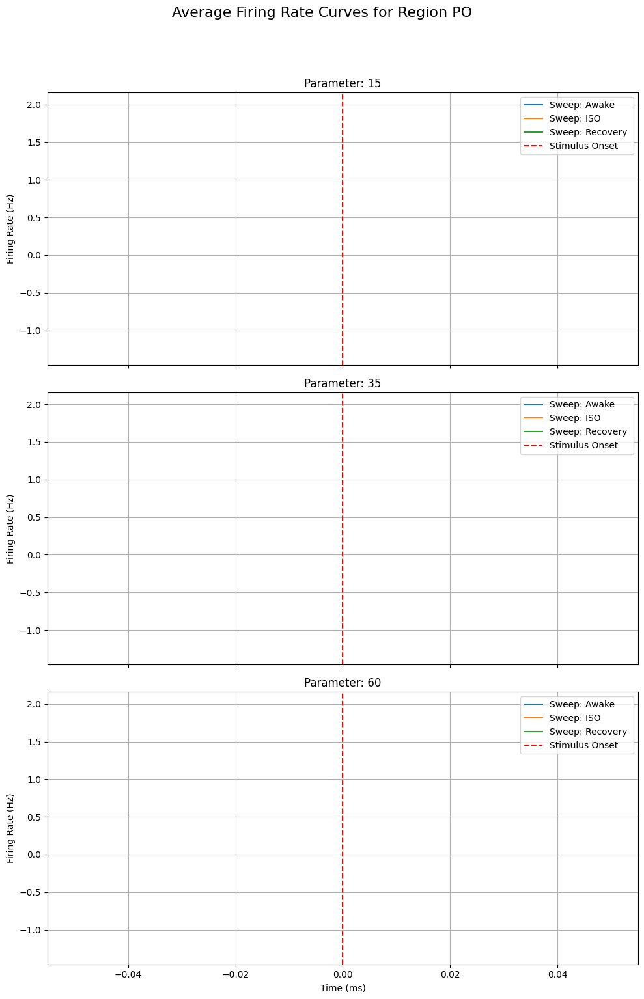

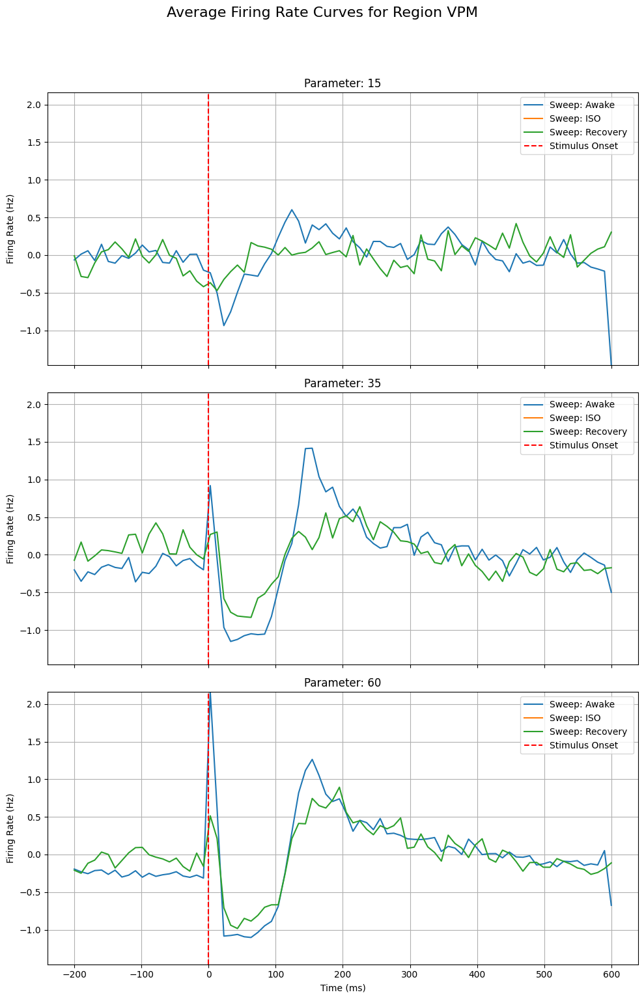

In [19]:
# Ensure all neurons are included, even with sparse data
for region in depth_order:
    fig, axs = plt.subplots(len(parameters), figsize=(10, 5 * len(parameters)), sharex=True)
    fig.suptitle(f'Average Firing Rate Curves for Region {region}', fontsize=16, y=1.02)

    for i, param in enumerate(parameters):
        any_data = False
        for sweep, firing_rate in average_firing_rates[region][param].items():
            # Include all firing rates, even if sparse
            if firing_rate is not None and len(firing_rate) > 0:
                axs[i].plot(time_bins, firing_rate, label=f'Sweep: {sweep_labels[sweep]}')
                any_data = True

        if any_data:
            axs[i].axvline(0, color='red', linestyle='--', label='Stimulus Onset')
            axs[i].set_ylim(y_min, y_max)
            axs[i].set_ylabel('Firing Rate (Hz)')
            axs[i].set_title(f'Parameter: {param}')
            axs[i].legend(loc='upper right')
            axs[i].grid(True)
        else:
            axs[i].plot([], [])  # Placeholder for inactive neurons
            axs[i].set_ylim(y_min, y_max)
            axs[i].set_title(f'Parameter: {param} (No activity)')

    axs[-1].set_xlabel('Time (ms)')
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()


In [22]:
average_firing_rates

{'SSp-tr2/3': {'15': {}, '35': {}, '60': {}},
 'SSp-tr4': {'15': {}, '35': {}, '60': {}},
 'SSp-tr5': {'15': {}, '35': {}, '60': {}},
 'SSp-tr6a': {'15': {}, '35': {}, '60': {}},
 'SSp-ll6a': {'15': {}, '35': {}, '60': {}},
 'SSp-ll6b': {'15': {}, '35': {}, '60': {}},
 'cing': {'15': {}, '35': {}, '60': {}},
 'ccb': {'15': {}, '35': {}, '60': {}},
 'alv': {'15': {}, '35': {}, '60': {}},
 'CA1': {'15': {}, '35': {}, '60': {}},
 'CA3': {'15': {}, '35': {}, '60': {}},
 'LD': {'15': {np.int64(0): array([-0.19855244,  0.13692025, -0.09871927,  0.07258383, -0.08520358,
           0.06903914,  0.01990339,  0.11122482,  0.14803304,  0.14304493,
           0.06653241,  0.01729029, -0.09597605,  0.01900934, -0.04591988,
           0.13435869,  0.00680346, -0.09119151,  0.18658455,  0.11811936,
          -0.20871889,  0.03176329, -0.05838757, -0.18048374, -0.10964917,
          -0.03435545, -0.14508837, -0.02578982,  0.04453366,  0.0057313 ,
           0.0371543 ,  0.02109137, -0.19760208,  0.025

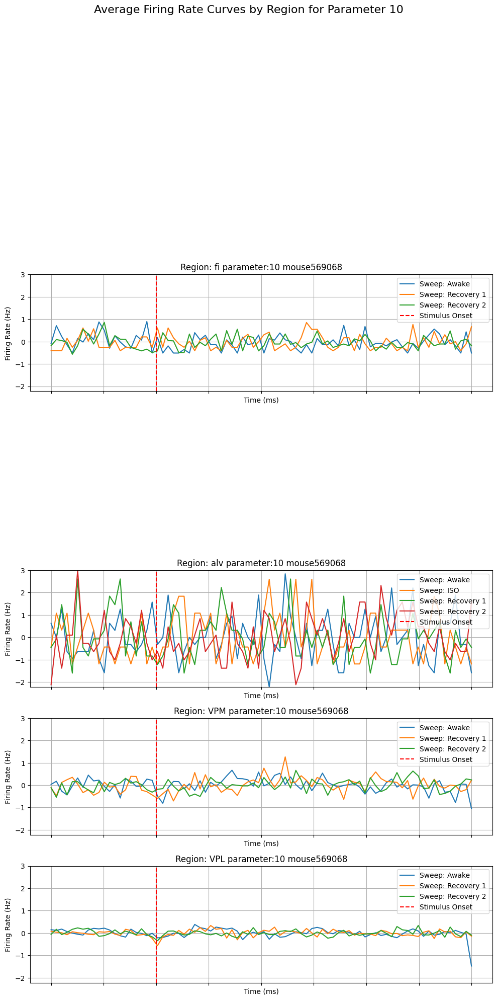

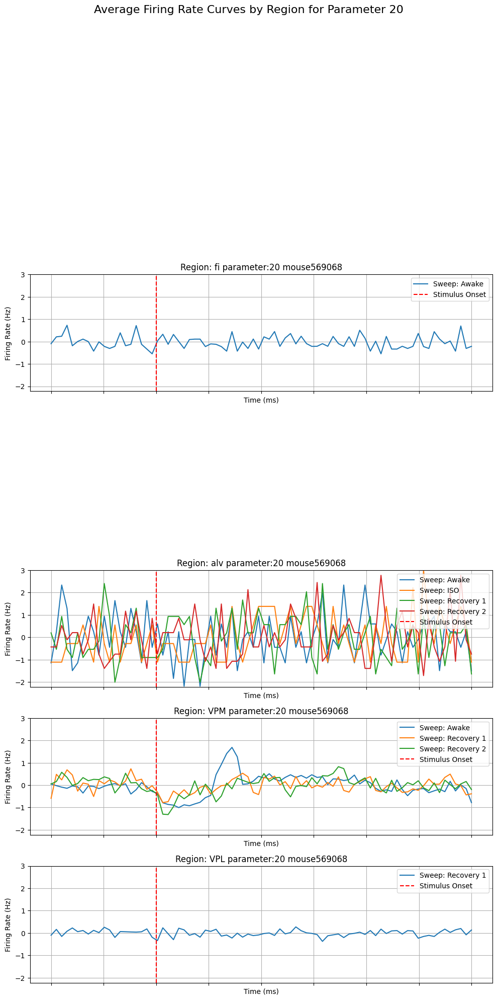

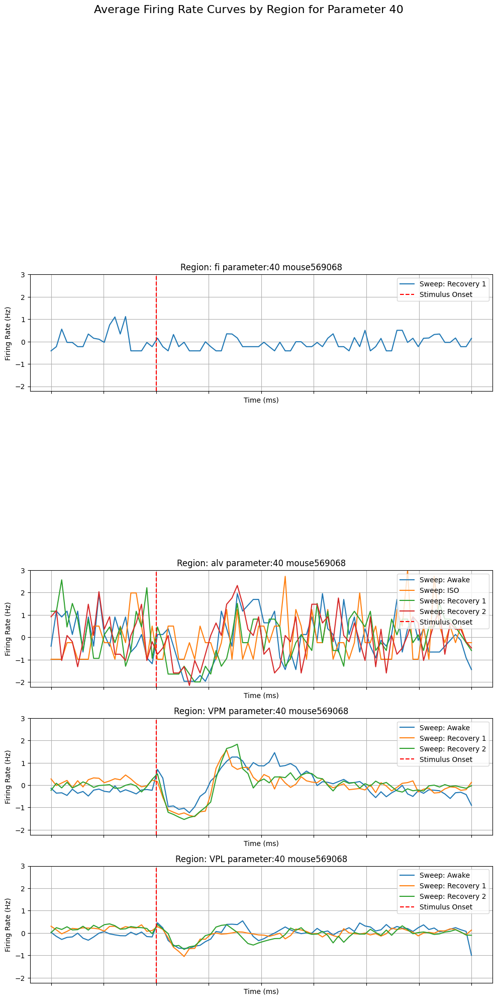

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Load data
df_stim = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/meta_stim')
df_probeB_spikes = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/probeB_spikes')
meta_units = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/meta_units').loc['probeB']
neuron_regions = meta_units['area']

# Define depth order of brain regions
depth_order = ['SSp-ll5', 'SSp-ll6a', 'SSp-ll6b', 'SSp-tr2/3', 'SSp-tr4', 'SSp-tr5', 
               'CA1', 'CA2', 'CA3', 'LD', 'VPL', 'VPM', 'alv', 'ccb', 'fi', 'scwm'][::-1]

# Convert region labels to categorical data using depth order and sort neurons
region_sorted = pd.Categorical(neuron_regions, categories=depth_order, ordered=True)
region_sorted_indices = np.argsort(region_sorted.codes)

# Define time window, bin size, and bins for analysis
window_start, window_end, bin_size = -200, 600, 10
num_bins = int((window_end - window_start) / bin_size)
time_bins = np.linspace(window_start, window_end, num_bins)

# Filter for 'biphasic' stimuli and get parameters and sweeps
df_biphasic = df_stim[df_stim['stim_type'] == 'biphasic']
parameters = np.sort(df_biphasic['parameter'].unique())
sweeps = np.sort(df_biphasic['sweep'].unique())
sweep_labels = {0: 'Awake', 1: 'ISO', 2: 'Recovery 1', 3: 'Recovery 2'}

# Initialize dictionary to store firing rates for each region, parameter, and sweep
average_firing_rates = {region: {param: {} for param in parameters} for region in depth_order}

# Calculate firing rate matrices by region, parameter, and sweep
for param in parameters:
    for sweep in sweeps:
        df_param_sweep = df_biphasic[(df_biphasic['parameter'] == param) & (df_biphasic['sweep'] == sweep)]
        
        for region in depth_order:
            neuron_indices = [idx for idx, r in enumerate(region_sorted) if r == region]
            neuron_firing_rates = []
            
            for neuron_idx in neuron_indices:
                if neuron_idx < df_probeB_spikes.shape[1]:  # Ensure index is within bounds
                    spike_times = df_probeB_spikes.index[df_probeB_spikes.iloc[:, neuron_idx]]
                    neuron_responses = []
                    
                    for _, stim_row in df_param_sweep.iterrows():
                        onset_time = stim_row['onset']
                        bins = np.arange(onset_time + window_start / 1000, onset_time + window_end / 1000, bin_size / 1000)
                        binned_spikes, _ = np.histogram(spike_times, bins=bins)
                        binned_spikes = np.pad(binned_spikes, (0, num_bins - len(binned_spikes)), 'constant') if len(binned_spikes) < num_bins else binned_spikes[:num_bins]
                        neuron_responses.append(binned_spikes)
                    
                    if neuron_responses:  # Check if there were any responses to the stimulus
                        neuron_responses = np.array(neuron_responses)
                        average_response = np.mean(neuron_responses, axis=0)
                        z_scored_response = np.clip(zscore(average_response), -3, 3)  # Z-score and clip
                        neuron_firing_rates.append(z_scored_response)
                
            if neuron_firing_rates:
                firing_rate_matrix = np.array(neuron_firing_rates)
                mean_firing_rate_across_neurons = np.mean(firing_rate_matrix, axis=0)
                average_firing_rates[region][param][sweep] = mean_firing_rate_across_neurons

# Determine global y-axis limits based on all data
all_firing_rates = [
    firing_rate for region_data in average_firing_rates.values() 
    for param_data in region_data.values() 
    for firing_rate in param_data.values()
]

y_min, y_max = np.nanmin(all_firing_rates), np.nanmax(all_firing_rates)
if not np.isfinite(y_min) or not np.isfinite(y_max):  # Default if no finite values
    y_min, y_max = -3, 3

# Plotting: Separate plots for each parameter, with sweeps displayed in each
for param in parameters:
    fig, axs = plt.subplots(len(depth_order), figsize=(10, 3 * len(depth_order)), sharex=True)
    fig.suptitle(f'Average Firing Rate Curves by Region for Parameter {param}', fontsize=16, y=1.02)
    
    # Track which subplots have data
    visible_plots = []

    for i, region in enumerate(depth_order):
        if region in average_firing_rates and param in average_firing_rates[region]:
            any_data = False
            for sweep, firing_rate in average_firing_rates[region][param].items():
                if np.any(np.isfinite(firing_rate)):  # Check if the firing rate data is valid
                    axs[i].plot(time_bins, firing_rate, label=f'Sweep: {sweep_labels[sweep]}')
                    any_data = True
                
            if any_data:
                # Apply global y-axis limits and styling to each subplot
                axs[i].axvline(0, color='red', linestyle='--', label='Stimulus Onset')  # Mark stimulus onset
                axs[i].set_ylim(y_min, y_max)
                axs[i].set_ylabel('Firing Rate (Hz)')
                axs[i].set_title(f'Region: {region} parameter:{param} mouse569068')
                axs[i].legend(loc='upper right')
                axs[i].grid(True)
                axs[i].set_xlabel('Time (ms)')
                visible_plots.append(i)  # Mark this plot as having data
            else:
                axs[i].set_visible(False)  # Hide the plot if there is no data for that region

        else:
            axs[i].set_visible(False)  # Hide the plot if no data for that region and parameter

    # Remove empty subplots from the figure
    visible_plots = np.array(visible_plots)
    axs = axs[visible_plots]  # Only keep subplots with data

    # Final adjustments for the entire figure
    axs[-1].set_xlabel('Time (ms)')
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()


In [ ]:
avera

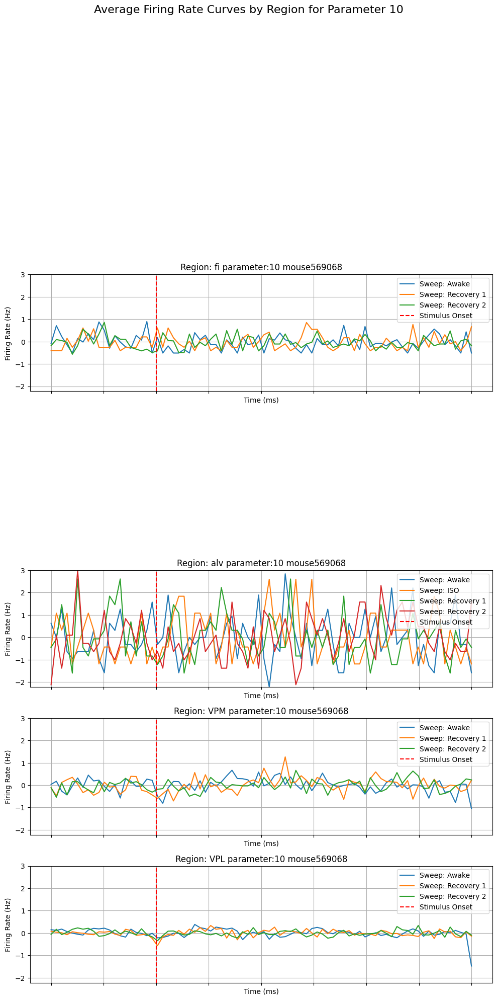

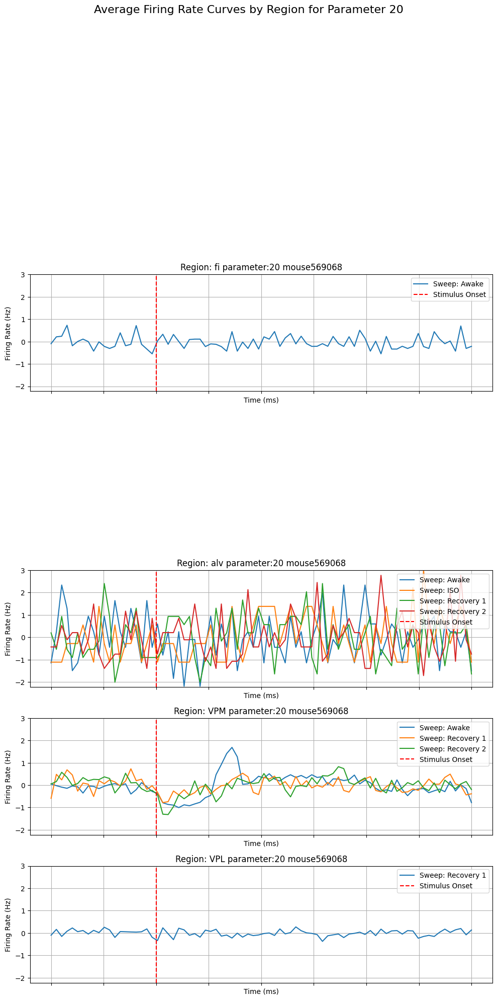

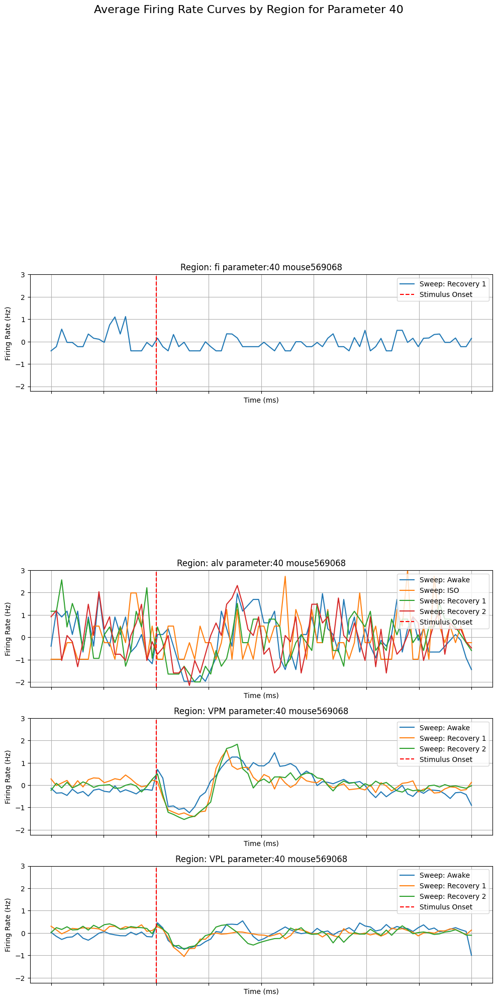

In [46]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Load data
df_stim = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/meta_stim')
df_probeB_spikes = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/probeB_spikes')
meta_units = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/meta_units').loc['probeB']
neuron_regions = meta_units['area']

# Define depth order of brain regions
depth_order = ['SSp-ll5', 'SSp-ll6a', 'SSp-ll6b', 'SSp-tr2/3', 'SSp-tr4', 'SSp-tr5', 
               'CA1', 'CA2', 'CA3', 'LD', 'VPL', 'VPM', 'alv', 'ccb', 'fi', 'scwm'][::-1]

# Convert region labels to categorical data using depth order and sort neurons
region_sorted = pd.Categorical(neuron_regions, categories=depth_order, ordered=True)
region_sorted_indices = np.argsort(region_sorted.codes)

# Define time window, bin size, and bins for analysis
window_start, window_end, bin_size = -200, 600, 10
num_bins = int((window_end - window_start) / bin_size)
time_bins = np.linspace(window_start, window_end, num_bins)

# Filter for 'biphasic' stimuli and get parameters and sweeps
df_biphasic = df_stim[df_stim['stim_type'] == 'biphasic']
parameters = np.sort(df_biphasic['parameter'].unique())
sweeps = np.sort(df_biphasic['sweep'].unique())
sweep_labels = {0: 'Awake', 1: 'ISO', 2: 'Recovery 1', 3: 'Recovery 2'}

# Initialize dictionary to store firing rates for each region, parameter, and sweep
average_firing_rates = {region: {param: {} for param in parameters} for region in depth_order}

# Calculate firing rate matrices by region, parameter, and sweep
for param in parameters:
    for sweep in sweeps:
        df_param_sweep = df_biphasic[(df_biphasic['parameter'] == param) & (df_biphasic['sweep'] == sweep)]
        
        for region in depth_order:
            neuron_indices = [idx for idx, r in enumerate(region_sorted) if r == region]
            neuron_firing_rates = []
            
            for neuron_idx in neuron_indices:
                if neuron_idx < df_probeB_spikes.shape[1]:  # Ensure index is within bounds
                    spike_times = df_probeB_spikes.index[df_probeB_spikes.iloc[:, neuron_idx]]
                    neuron_responses = []
                    
                    for _, stim_row in df_param_sweep.iterrows():
                        onset_time = stim_row['onset']
                        bins = np.arange(onset_time + window_start / 1000, onset_time + window_end / 1000, bin_size / 1000)
                        binned_spikes, _ = np.histogram(spike_times, bins=bins)
                        binned_spikes = np.pad(binned_spikes, (0, num_bins - len(binned_spikes)), 'constant') if len(binned_spikes) < num_bins else binned_spikes[:num_bins]
                        neuron_responses.append(binned_spikes)
                    
                    if neuron_responses:  # Check if there were any responses to the stimulus
                        neuron_responses = np.array(neuron_responses)
                        average_response = np.mean(neuron_responses, axis=0)
                        z_scored_response = np.clip(zscore(average_response), -3, 3)  # Z-score and clip
                        neuron_firing_rates.append(z_scored_response)
                
            if neuron_firing_rates:
                firing_rate_matrix = np.array(neuron_firing_rates)
                mean_firing_rate_across_neurons = np.mean(firing_rate_matrix, axis=0)
                average_firing_rates[region][param][sweep] = mean_firing_rate_across_neurons

# Determine global y-axis limits based on all data
all_firing_rates = [
    firing_rate for region_data in average_firing_rates.values() 
    for param_data in region_data.values() 
    for firing_rate in param_data.values()
]

y_min, y_max = np.nanmin(all_firing_rates), np.nanmax(all_firing_rates)
if not np.isfinite(y_min) or not np.isfinite(y_max):  # Default if no finite values
    y_min, y_max = -3, 3

# Plotting: Separate plots for each parameter, with sweeps displayed in each
for param in parameters:
    fig, axs = plt.subplots(len(depth_order), figsize=(10, 3 * len(depth_order)), sharex=True)
    fig.suptitle(f'Average Firing Rate Curves by Region for Parameter {param}', fontsize=16, y=1.02)
    
    for i, region in enumerate(depth_order):
        if region in average_firing_rates and param in average_firing_rates[region]:
            any_data = False
            for sweep, firing_rate in average_firing_rates[region][param].items():
                if np.any(np.isfinite(firing_rate)):  # Check if the firing rate data is valid
                    axs[i].plot(time_bins, firing_rate, label=f'Sweep: {sweep_labels[sweep]}')
                    any_data = True
                
            if any_data:
                # Apply global y-axis limits and styling to each subplot
                axs[i].axvline(0, color='red', linestyle='--', label='Stimulus Onset')  # Mark stimulus onset
                axs[i].set_ylim(y_min, y_max)
                axs[i].set_ylabel('Firing Rate (Hz)')
                axs[i].set_title(f'Region: {region} parameter:{param} mouse569068')
                axs[i].legend(loc='upper right')
                axs[i].grid(True)
                axs[i].set_xlabel('Time (ms)')
            else:
                axs[i].set_visible(False)  # Hide the plot if there is no data for that region

        else:
            axs[i].set_visible(False)  # Hide the plot if no data for that region and parameter

    # Final adjustments for the entire figure
    #axs[-1].set_xlabel('Time (ms)')
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()


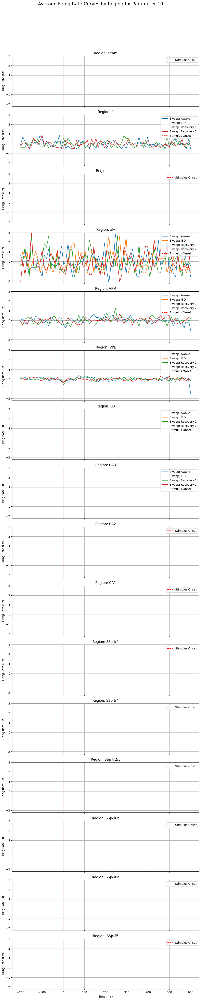

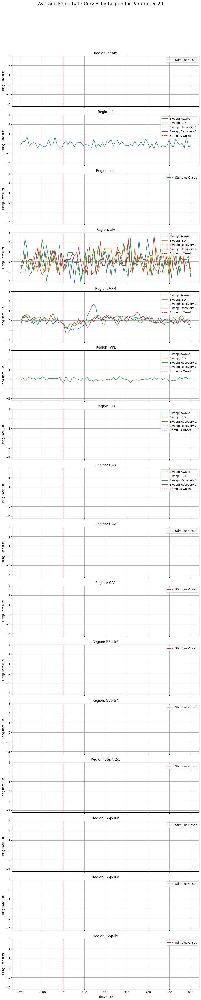

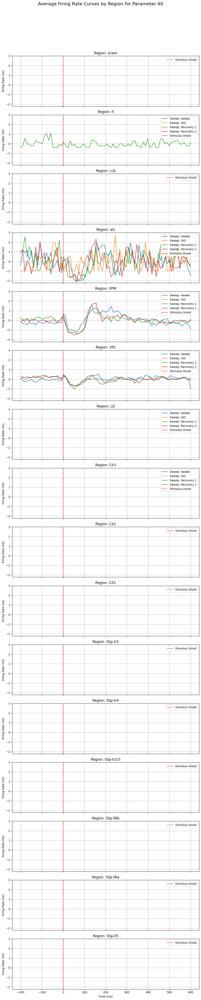

In [41]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Load data
df_stim = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/meta_stim')
df_probeB_spikes = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/probeB_spikes')
meta_units = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/meta_units').loc['probeB']
neuron_regions = meta_units['area']

# Define depth order of brain regions
depth_order = ['SSp-ll5', 'SSp-ll6a', 'SSp-ll6b', 'SSp-tr2/3', 'SSp-tr4', 'SSp-tr5', 
               'CA1', 'CA2', 'CA3', 'LD', 'VPL', 'VPM', 'alv', 'ccb', 'fi', 'scwm'][::-1]

# Convert region labels to categorical data using depth order and sort neurons
region_sorted = pd.Categorical(neuron_regions, categories=depth_order, ordered=True)
region_sorted_indices = np.argsort(region_sorted.codes)

# Define time window, bin size, and bins for analysis
window_start, window_end, bin_size = -200, 600, 10
num_bins = int((window_end - window_start) / bin_size)
time_bins = np.linspace(window_start, window_end, num_bins)

# Filter for 'biphasic' stimuli and get parameters and sweeps
df_biphasic = df_stim[df_stim['stim_type'] == 'biphasic']
parameters = np.sort(df_biphasic['parameter'].unique())
sweeps = np.sort(df_biphasic['sweep'].unique())
sweep_labels = {0: 'Awake', 1: 'ISO', 2: 'Recovery 1', 3: 'Recovery 2'}

# Initialize dictionary to store firing rates for each region, parameter, and sweep
average_firing_rates = {region: {param: {} for param in parameters} for region in depth_order}

# Calculate firing rate matrices by region, parameter, and sweep
for param in parameters:
    for sweep in sweeps:
        df_param_sweep = df_biphasic[(df_biphasic['parameter'] == param) & (df_biphasic['sweep'] == sweep)]
        
        for region in depth_order:
            neuron_indices = [idx for idx, r in enumerate(region_sorted) if r == region]
            neuron_firing_rates = []
            
            for neuron_idx in neuron_indices:
                if neuron_idx < df_probeB_spikes.shape[1]:  # Ensure index is within bounds
                    spike_times = df_probeB_spikes.index[df_probeB_spikes.iloc[:, neuron_idx]]
                    neuron_responses = []
                    
                    for _, stim_row in df_param_sweep.iterrows():
                        onset_time = stim_row['onset']
                        bins = np.arange(onset_time + window_start / 1000, onset_time + window_end / 1000, bin_size / 1000)
                        binned_spikes, _ = np.histogram(spike_times, bins=bins)
                        binned_spikes = np.pad(binned_spikes, (0, num_bins - len(binned_spikes)), 'constant') if len(binned_spikes) < num_bins else binned_spikes[:num_bins]
                        neuron_responses.append(binned_spikes)
                    
                    neuron_responses = np.array(neuron_responses)
                    average_response = np.mean(neuron_responses, axis=0)
                    z_scored_response = np.clip(zscore(average_response), -3, 3)  # Z-score and clip
                    neuron_firing_rates.append(z_scored_response)
                
            if neuron_firing_rates:
                firing_rate_matrix = np.array(neuron_firing_rates)
                mean_firing_rate_across_neurons = np.mean(firing_rate_matrix, axis=0)
                average_firing_rates[region][param][sweep] = mean_firing_rate_across_neurons

# Determine global y-axis limits based on all data
all_firing_rates = [
    firing_rate for region_data in average_firing_rates.values() 
    for param_data in region_data.values() 
    for firing_rate in param_data.values()
]

y_min, y_max = np.nanmin(all_firing_rates), np.nanmax(all_firing_rates)
if not np.isfinite(y_min) or not np.isfinite(y_max):  # Default if no finite values
    y_min, y_max = -3, 3

# Plotting: Separate plots for each parameter, with sweeps displayed in each
for param in parameters:
    fig, axs = plt.subplots(len(depth_order), figsize=(10, 3 * len(depth_order)), sharex=True)
    fig.suptitle(f'Average Firing Rate Curves by Region for Parameter {param}', fontsize=16, y=1.02)
    
    for i, region in enumerate(depth_order):
        if region in average_firing_rates and param in average_firing_rates[region]:
            for sweep, firing_rate in average_firing_rates[region][param].items():
                axs[i].plot(time_bins, firing_rate, label=f'Sweep: {sweep_labels[sweep]}')
                
            # Apply global y-axis limits and styling to each subplot
            axs[i].axvline(0, color='red', linestyle='--', label='Stimulus Onset')  # Mark stimulus onset
            axs[i].set_ylim(y_min, y_max)
            axs[i].set_ylabel('Firing Rate (Hz)')
            axs[i].set_title(f'Region: {region}')
            axs[i].legend(loc='upper right')
            axs[i].grid(True)
        
        else:
            axs[i].set_visible(False)  # Hide the plot if no data for that region

    # Final adjustments for the entire figure
    axs[-1].set_xlabel('Time (ms)')
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Load data
df_stim = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/meta_stim')
df_probeB_spikes = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/probeB_spikes')
meta_units = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/meta_units').loc['probeB']
neuron_regions = meta_units['area']

# Define depth order of brain regions
depth_order = ['SSp-ll5', 'SSp-ll6a', 'SSp-ll6b', 'SSp-tr2/3', 'SSp-tr4', 'SSp-tr5', 
               'CA1', 'CA2', 'CA3', 'LD', 'VPL', 'VPM', 'alv', 'ccb', 'fi', 'scwm'][::-1]

In [3]:
depth_order = [region for region in depth_order if region in neuron_regions.unique()]
depth_order

['scwm',
 'fi',
 'ccb',
 'alv',
 'VPM',
 'VPL',
 'LD',
 'CA3',
 'CA2',
 'CA1',
 'SSp-tr5',
 'SSp-tr4',
 'SSp-tr2/3',
 'SSp-ll6b',
 'SSp-ll6a',
 'SSp-ll5']

In [5]:
region_sorted = pd.Categorical(neuron_regions, categories=depth_order, ordered=True)
region_sorted_indices = np.argsort(region_sorted.codes)

In [6]:
for region in depth_order:
    neuron_indices = [idx for idx, r in enumerate(region_sorted) if r == region]
    print(f'Region: {region}, Neuron count: {len(neuron_indices)}')

    if not neuron_indices:
        print(f"No neurons for region: {region}")
        continue


Region: scwm, Neuron count: 19
Region: fi, Neuron count: 6
Region: ccb, Neuron count: 5
Region: alv, Neuron count: 7
Region: VPM, Neuron count: 20
Region: VPL, Neuron count: 95
Region: LD, Neuron count: 111
Region: CA3, Neuron count: 59
Region: CA2, Neuron count: 12
Region: CA1, Neuron count: 8
Region: SSp-tr5, Neuron count: 9
Region: SSp-tr4, Neuron count: 24
Region: SSp-tr2/3, Neuron count: 29
Region: SSp-ll6b, Neuron count: 11
Region: SSp-ll6a, Neuron count: 47
Region: SSp-ll5, Neuron count: 12


In [14]:

# Define time window, bin size, and bins for analysis
window_start, window_end, bin_size = -200, 600, 10
num_bins = int((window_end - window_start) / bin_size)
time_bins = np.linspace(window_start, window_end, num_bins)

# Filter for 'biphasic' stimuli and get parameters and sweeps
df_biphasic = df_stim[df_stim['stim_type'] == 'biphasic']
parameters = np.sort(df_biphasic['parameter'].unique())
sweeps = np.sort(df_biphasic['sweep'].unique())
sweep_labels = {0: 'Awake', 1: 'ISO', 2: 'Recovery 1', 3: 'Recovery 2'}

# Initialize dictionary to store firing rates for each region, parameter, and sweep
average_firing_rates = {region: {param: {} for param in parameters} for region in depth_order}

# Set y-axis range to keep plots consistent
y_min, y_max = -3, 3


In [21]:
for param in parameters:
    for sweep in sweeps:
        df_param_sweep = df_biphasic[(df_biphasic['parameter'] == param) & (df_biphasic['sweep'] == sweep)]
        
        if df_param_sweep.empty:
            continue
        
        for region in depth_order:
            neuron_indices = [idx for idx, r in enumerate(region_sorted) if r == region]
            if not neuron_indices:
                print(f"No neurons for region: {region}")
                continue
            
            neuron_firing_rates = []
            
            for neuron_idx in neuron_indices:
                if neuron_idx < df_probeB_spikes.shape[1]:
                    spike_times = df_probeB_spikes.index[df_probeB_spikes.iloc[:, neuron_idx]]
                    neuron_responses = []
                    
                    for _, stim_row in df_param_sweep.iterrows():
                        onset_time = stim_row['onset']
                        bins = np.arange(onset_time + window_start / 1000, onset_time + window_end / 1000, bin_size / 1000)
                        binned_spikes, _ = np.histogram(spike_times, bins=bins)
                        
                        if binned_spikes.sum() == 0:
                            continue
                        
                        binned_spikes = np.pad(binned_spikes, (0, num_bins - len(binned_spikes)), 'constant') if len(binned_spikes) < num_bins else binned_spikes[:num_bins]
                        neuron_responses.append(binned_spikes)
                    
                    if neuron_responses:
                        neuron_responses = np.array(neuron_responses)
                        average_response = np.mean(neuron_responses, axis=0)
                        z_scored_response = np.clip(zscore(average_response), y_min, y_max)
                        neuron_firing_rates.append(z_scored_response)
            
            if neuron_firing_rates:
                firing_rate_matrix = np.array(neuron_firing_rates)
                mean_firing_rate_across_neurons = np.mean(firing_rate_matrix, axis=0)
                average_firing_rates[region][param][sweep] = mean_firing_rate_across_neurons
            else:
                print(f"No firing rates computed for region: {region}, parameter: {param}, sweep: {sweep}")


No firing rates computed for region: SSp-tr2/3, parameter: 15, sweep: 0
No firing rates computed for region: SSp-tr4, parameter: 15, sweep: 0
No firing rates computed for region: SSp-tr5, parameter: 15, sweep: 0
No firing rates computed for region: SSp-tr6a, parameter: 15, sweep: 0
No firing rates computed for region: SSp-ll6a, parameter: 15, sweep: 0
No firing rates computed for region: SSp-ll6b, parameter: 15, sweep: 0
No firing rates computed for region: cing, parameter: 15, sweep: 0
No firing rates computed for region: ccb, parameter: 15, sweep: 0
No firing rates computed for region: alv, parameter: 15, sweep: 0
No firing rates computed for region: CA1, parameter: 15, sweep: 0
No firing rates computed for region: CA3, parameter: 15, sweep: 0
No firing rates computed for region: SSp-tr2/3, parameter: 15, sweep: 1
No firing rates computed for region: SSp-tr4, parameter: 15, sweep: 1
No firing rates computed for region: SSp-tr5, parameter: 15, sweep: 1
No firing rates computed for reg

In [32]:
df_stim

,stim_type,parameter,onset,offset,duration,sweep
0,biphasic,20,314.97941,314.97981,0.0004,0
1,biphasic,10,318.51243,318.51283,0.0004,0
2,biphasic,20,322.57405,322.57445,0.0004,0
3,biphasic,40,326.95634,326.95674,0.0004,0
4,biphasic,40,331.12595,331.12635,0.0004,0
...,...,...,...,...,...,...
1795,biphasic,40,8927.60243,8927.60283,0.0004,3
1796,biphasic,40,8931.51737,8931.51777,0.0004,3
1797,biphasic,40,8935.48263,8935.48303,0.0004,3
1798,biphasic,10,8939.74701,8939.74741,0.0004,3


In [33]:
df_probeB_spikes

units,0,1,4,6,13,19,20,26,28,31,...,463,464,465,466,468,469,470,472,473,476
time,,,,,,,,,,,,,,,,,,,,,
3.483,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3.484,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3.485,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3.486,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3.487,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9023.809,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
9023.810,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
9023.811,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [34]:
meta_units

,firing_rate,presence_ratio,isi_viol,amplitude_cutoff,isolation_distance,l_ratio,d_prime,nn_hit_rate,nn_miss_rate,silhouette_score,...,repolarization_slope,recovery_slope,amplitude,spread,velocity_above,velocity_below,area,ccf_coord,is_ipsi,group
cluster_id,,,,,,,,,,,,,,,,,,,,,
0,4.595608,0.88,0.064929,0.002293,42.936726,0.001894,4.177017,0.977517,0.001173,NaN,...,0.836635,-0.137358,147.677790,60.0,6.357502,NaN,VPM,"[673, 371, 383]",True,noise
1,7.840493,0.72,0.053399,0.000659,77.557888,0.000638,6.194151,0.975333,0.001816,0.140977,...,0.856199,-0.150488,150.933900,20.0,0.686767,NaN,VPM,"[673, 371, 383]",True,noise
2,2.909421,0.91,0.819774,0.500000,30.233765,0.007994,2.563733,0.762346,0.003816,0.159390,...,0.420385,-0.057413,46.052760,80.0,0.138989,NaN,VPM,"[673, 371, 383]",True,noise
3,0.397989,0.64,2.623305,0.068854,12.375334,0.029585,3.060319,0.195402,0.001371,0.128476,...,0.771367,-0.109985,115.431420,30.0,1.373534,NaN,VPM,"[673, 371, 383]",True,noise
4,5.543243,0.77,0.150102,0.000171,41.722511,0.005420,4.732931,0.936170,0.001999,0.102307,...,1.098514,-0.175189,284.785605,40.0,0.068677,NaN,VPM,"[673, 371, 383]",True,noise
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
476,0.044566,0.70,0.000000,0.045765,15.111118,0.119845,3.629738,0.333333,0.000000,NaN,...,0.739332,-0.066203,338.345373,70.0,-0.618090,-1.167504,SSp-ll6b,"[657, 167, 391]",True,NaN
477,0.203318,0.66,5.025843,0.032194,27.902853,0.019128,2.751721,0.063492,0.001336,0.030995,...,0.260514,-0.034874,86.880105,120.0,0.940217,0.137353,SSp-tr2/3,"[650, 85, 394]",True,NaN
478,0.057647,0.68,50.013923,0.085403,47.685695,0.000423,5.370458,0.533333,0.000167,NaN,...,0.168228,-0.015135,117.494625,70.0,-0.686767,-1.510888,scwm,"[657, 171, 390]",True,NaN


In [25]:
df_stim.columns

Index(['stim_type', 'parameter', 'onset', 'offset', 'duration', 'sweep'], dtype='object')

In [28]:
df_probeB_spikes.columns

Index([  0,   1,   4,   6,  13,  19,  20,  26,  28,  31,
       ...
       463, 464, 465, 466, 468, 469, 470, 472, 473, 476],
      dtype='int64', name='units', length=216)

In [29]:
meta_units.columns

Index(['firing_rate', 'presence_ratio', 'isi_viol', 'amplitude_cutoff',
       'isolation_distance', 'l_ratio', 'd_prime', 'nn_hit_rate',
       'nn_miss_rate', 'silhouette_score', 'max_drift', 'cumulative_drift',
       'epoch_name_quality_metrics', 'epoch_name_waveform_metrics',
       'peak_channel', 'snr', 'duration', 'halfwidth', 'PT_ratio',
       'repolarization_slope', 'recovery_slope', 'amplitude', 'spread',
       'velocity_above', 'velocity_below', 'area', 'ccf_coord', 'is_ipsi',
       'group'],
      dtype='object')

In [40]:
# Check for linking columns in df_probeB_spikes
print(df_probeB_spikes.columns)  # Look for a key like 'neuron_id' or 'unit_id'

# Merge the region information into df_probeB_spikes
df_probeB_spikes = df_probeB_spikes.merge(
    meta_units[['area']], 
    left_on='cluster_id',  # Replace 'unit_id' with the actual linking column in df_probeB_spikes
    right_index=True
)

# Rename 'area' to 'region' for clarity
df_probeB_spikes.rename(columns={'area': 'region'}, inplace=True)


Index([  0,   1,   4,   6,  13,  19,  20,  26,  28,  31,
       ...
       463, 464, 465, 466, 468, 469, 470, 472, 473, 476],
      dtype='int64', name='units', length=216)


KeyError: 'cluster_id'

In [39]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Filter stim_type to only include "biphasic"
df_stim_filtered = df_stim[df_stim['stim_type'] == 'biphasic']

# Merge meta_units with df_probeB_spikes to get area information
meta_units = meta_units.reset_index()  # Ensure 'cluster id' is accessible
df_spike_units = df_probeB_spikes.T  # Transpose spike data to align units as rows
df_spike_units.index = df_spike_units.index.astype(int)  # Ensure index is integer
df_spike_units = df_spike_units.join(meta_units.set_index('cluster_id'))  # Add meta info

# Initialize storage for average firing rate curves
average_curves = {}

# Loop over areas, parameters, and sweeps
for area in df_spike_units['area'].unique():
    if pd.isna(area):  # Skip if area is NaN
        continue
    
    average_curves[area] = {}
    
    # Filter spike data for the current area
    area_spike_data = df_spike_units[df_spike_units['area'] == area]
    
    for parameter in df_stim_filtered['parameter'].unique():
        for sweep in df_stim_filtered['sweep'].unique():
            # Get stimulus events for the current parameter and sweep
            stim_events = df_stim_filtered[
                (df_stim_filtered['parameter'] == parameter) & 
                (df_stim_filtered['sweep'] == sweep)
            ]
            
            # Initialize an array to store firing rate curves
            firing_rates = []
            
            for _, stim in stim_events.iterrows():
                onset, offset = stim['onset'], stim['offset']
                
                # Extract spike times for the units in this area
                spike_data = area_spike_data.loc[:, (area_spike_data.columns != 'area')]
                spikes_during_stim = spike_data.loc[onset:offset].sum(axis=0)
                
                # Compute firing rate (spikes / time window)
                firing_rate = spikes_during_stim / (offset - onset)
                firing_rates.append(firing_rate.values)
            
            # Compute the average firing rate curve for this parameter and sweep
            if firing_rates:
                average_firing_rate = np.mean(firing_rates, axis=0)
            else:
                average_firing_rate = np.zeros(spike_data.shape[1])  # Default to zero
            
            # Store the average firing rate curve
            average_curves[area][(parameter, sweep)] = average_firing_rate

# Plot the average firing rate curves for each area
for area, curves in average_curves.items():
    plt.figure(figsize=(15, 8))
    plt.title(f'Average Firing Rate Curves for Area: {area}', fontsize=16)
    plt.xlabel('Time (ms)', fontsize=14)
    plt.ylabel('Firing Rate (Hz)', fontsize=14)
    
    for (parameter, sweep), curve in curves.items():
        plt.plot(
            np.arange(len(curve)), curve, 
            label=f'Param: {parameter}, Sweep: {sweep}'
        )
    
    plt.legend()
    plt.grid(True)
    plt.show()


ValueError: cannot insert level_0, already exists

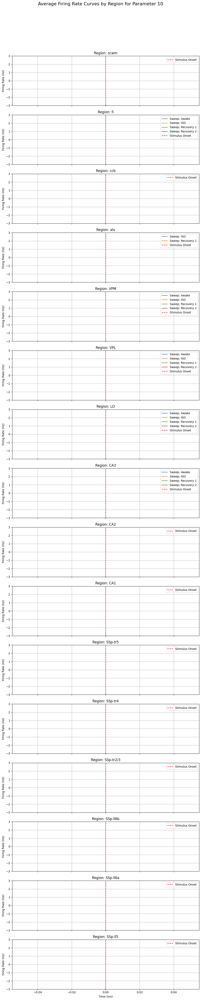

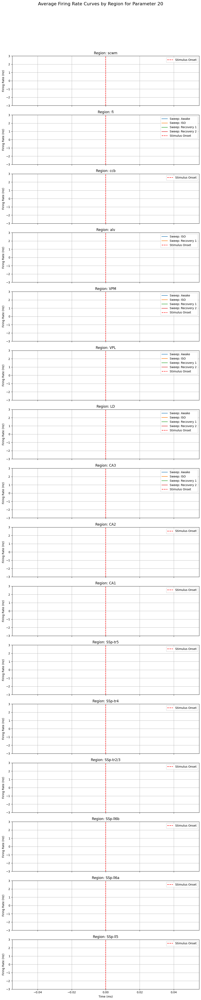

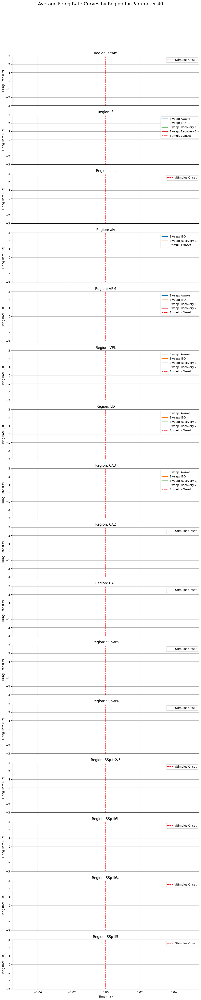

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Load data
df_stim = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/meta_stim')
df_probeB_spikes = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/probeB_spikes')
meta_units = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/meta_units').loc['probeB']
neuron_regions = meta_units['area']

# Define depth order of brain regions
depth_order = ['SSp-ll5', 'SSp-ll6a', 'SSp-ll6b', 'SSp-tr2/3', 'SSp-tr4', 'SSp-tr5', 
               'CA1', 'CA2', 'CA3', 'LD', 'VPL', 'VPM', 'alv', 'ccb', 'fi', 'scwm'][::-1]

# Convert region labels to categorical data using depth order and sort neurons
region_sorted = pd.Categorical(neuron_regions, categories=depth_order, ordered=True)
region_sorted_indices = np.argsort(region_sorted.codes)

# Define time window, bin size, and bins for analysis
window_start, window_end, bin_size = -200, 600, 10
num_bins = int((window_end - window_start) / bin_size)
time_bins = np.linspace(window_start, window_end, num_bins)

# Filter for 'biphasic' stimuli and get parameters and sweeps
df_biphasic = df_stim[df_stim['stim_type'] == 'biphasic']
parameters = np.sort(df_biphasic['parameter'].unique())
sweeps = np.sort(df_biphasic['sweep'].unique())
sweep_labels = {0: 'Awake', 1: 'ISO', 2: 'Recovery 1', 3: 'Recovery 2'}

# Initialize dictionary to store firing rates for each region, parameter, and sweep
average_firing_rates = {region: {param: {} for param in parameters} for region in depth_order}

# Set y-axis range to keep plots consistent
y_min, y_max = -3, 3

# Calculate firing rate matrices by region, parameter, and sweep
for param in parameters:
    for sweep in sweeps:
        df_param_sweep = df_biphasic[(df_biphasic['parameter'] == param) & (df_biphasic['sweep'] == sweep)]
        
        for region in depth_order:
            neuron_indices = [idx for idx, r in enumerate(region_sorted) if r == region]
            neuron_firing_rates = []
            
            for neuron_idx in neuron_indices:
                if neuron_idx < df_probeB_spikes.shape[1]:  # Ensure index is within bounds
                    spike_times = df_probeB_spikes.index[df_probeB_spikes.iloc[:, neuron_idx]]
                    neuron_responses = []
                    
                    for _, stim_row in df_param_sweep.iterrows():
                        onset_time = stim_row['onset']
                        bins = np.arange(onset_time + window_start / 1000, onset_time + window_end /1000,bin_size /1000)
                        binned_spikes, _ = np.histogram(spike_times, bins=bins)
                        
                        if len(binned_spikes) == 0 or binned_spikes.sum() == 0:
                            #print(f"Warning: Neuron index {neuron_idx} in region {region} has no spikes for param {param}, sweep {sweep}.")
                        
                       
                       # Ensure consistent length for each trial's response
                            binned_spikes = np.pad(binned_spikes, (0, num_bins - len(binned_spikes)), 'constant') if len(binned_spikes) < num_bins else binned_spikes[:num_bins]
    
                            neuron_responses.append(binned_spikes)
                        
                    # Convert to array and z-score across bins
                    if neuron_responses:
                        neuron_responses = np.array(neuron_responses)
                        average_response = np.mean(neuron_responses, axis=0)
                        z_scored_response = np.clip(zscore(average_response), y_min, y_max)
                        neuron_firing_rates.append(z_scored_response)
                
            if neuron_firing_rates:
                firing_rate_matrix = np.array(neuron_firing_rates)
                mean_firing_rate_across_neurons = np.mean(firing_rate_matrix, axis=0)
                average_firing_rates[region][param][sweep] = mean_firing_rate_across_neurons

# Plotting: Separate plots for each parameter, with sweeps displayed in each
for param in parameters:
    fig, axs = plt.subplots(len(depth_order), figsize=(10, 3 * len(depth_order)), sharex=True)
    fig.suptitle(f'Average Firing Rate Curves by Region for Parameter {param}', fontsize=16, y=1.02)
    
    for i, region in enumerate(depth_order):
        if region in average_firing_rates and param in average_firing_rates[region]:
            for sweep, firing_rate in average_firing_rates[region][param].items():
                axs[i].plot(time_bins, firing_rate, label=f'Sweep: {sweep_labels[sweep]}')
                
            # Apply global y-axis limits and styling to each subplot
            axs[i].axvline(0, color='red', linestyle='--', label='Stimulus Onset')  # Mark stimulus onset
            axs[i].set_ylim(y_min, y_max)
            axs[i].set_ylabel('Firing Rate (Hz)')
            axs[i].set_title(f'Region: {region}')
            axs[i].legend(loc='upper right')
            axs[i].grid(True)
        
        else:
            axs[i].set_visible(False)  # Hide the plot if no data for that region

    # Final adjustments for the entire figure
    axs[-1].set_xlabel('Time (ms)')
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()


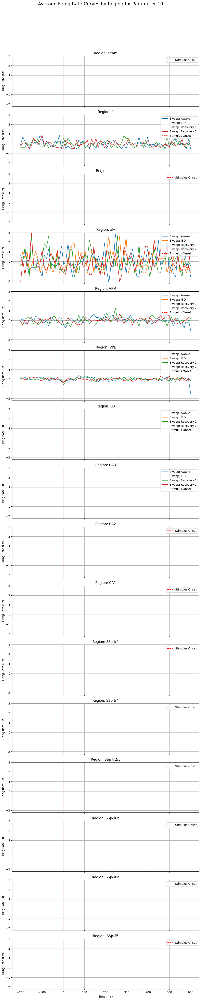

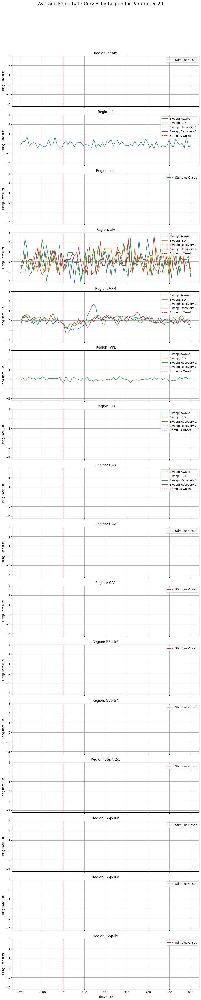

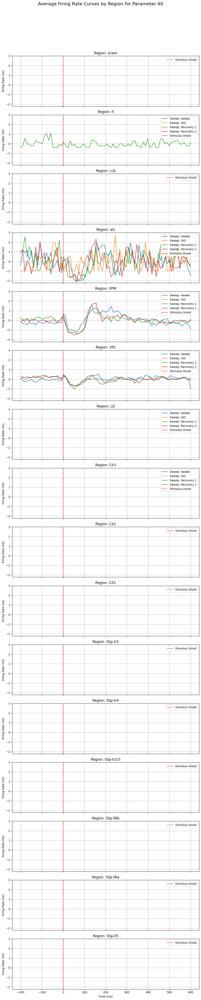

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Load data
df_stim = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/meta_stim')
df_probeB_spikes = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/probeB_spikes')
meta_units = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/meta_units').loc['probeB']
neuron_regions = meta_units['area']

# Define depth order of brain regions
depth_order = ['SSp-ll5', 'SSp-ll6a', 'SSp-ll6b', 'SSp-tr2/3', 'SSp-tr4', 'SSp-tr5', 
               'CA1', 'CA2', 'CA3', 'LD', 'VPL', 'VPM', 'alv', 'ccb', 'fi', 'scwm'][::-1]

# Convert region labels to categorical data using depth order and sort neurons
region_sorted = pd.Categorical(neuron_regions, categories=depth_order, ordered=True)
region_sorted_indices = np.argsort(region_sorted.codes)

# Define time window, bin size, and bins for analysis
window_start, window_end, bin_size = -200, 600, 10
num_bins = int((window_end - window_start) / bin_size)
time_bins = np.linspace(window_start, window_end, num_bins)

# Filter for 'biphasic' stimuli and get parameters and sweeps
df_biphasic = df_stim[df_stim['stim_type'] == 'biphasic']
parameters = np.sort(df_biphasic['parameter'].unique())
sweeps = np.sort(df_biphasic['sweep'].unique())
sweep_labels = {0: 'Awake', 1: 'ISO', 2: 'Recovery 1', 3: 'Recovery 2'}

# Initialize dictionary to store firing rates for each region, parameter, and sweep
average_firing_rates = {region: {param: {} for param in parameters} for region in depth_order}

# Calculate firing rate matrices by region, parameter, and sweep
for param in parameters:
    for sweep in sweeps:
        df_param_sweep = df_biphasic[(df_biphasic['parameter'] == param) & (df_biphasic['sweep'] == sweep)]
        
        for region in depth_order:
            neuron_indices = [idx for idx, r in enumerate(region_sorted) if r == region]
            neuron_firing_rates = []
            
            for neuron_idx in neuron_indices:
                if neuron_idx < df_probeB_spikes.shape[1]:  # Ensure index is within bounds
                    spike_times = df_probeB_spikes.index[df_probeB_spikes.iloc[:, neuron_idx]]
                    neuron_responses = []
                    
                    for _, stim_row in df_param_sweep.iterrows():
                        onset_time = stim_row['onset']
                        bins = np.arange(onset_time + window_start / 1000, onset_time + window_end / 1000, bin_size / 1000)
                        binned_spikes, _ = np.histogram(spike_times, bins=bins)
                        binned_spikes = np.pad(binned_spikes, (0, num_bins - len(binned_spikes)), 'constant') if len(binned_spikes) < num_bins else binned_spikes[:num_bins]
                        neuron_responses.append(binned_spikes)
                    
                    neuron_responses = np.array(neuron_responses)
                    average_response = np.mean(neuron_responses, axis=0)
                    z_scored_response = np.clip(zscore(average_response), -3, 3)  # Z-score and clip
                    neuron_firing_rates.append(z_scored_response)
                
            if neuron_firing_rates:
                firing_rate_matrix = np.array(neuron_firing_rates)
                mean_firing_rate_across_neurons = np.mean(firing_rate_matrix, axis=0)
                average_firing_rates[region][param][sweep] = mean_firing_rate_across_neurons

# Determine global y-axis limits based on all data
all_firing_rates = [
    firing_rate for region_data in average_firing_rates.values() 
    for param_data in region_data.values() 
    for firing_rate in param_data.values()
]

y_min, y_max = np.nanmin(all_firing_rates), np.nanmax(all_firing_rates)
if not np.isfinite(y_min) or not np.isfinite(y_max):  # Default if no finite values
    y_min, y_max = -3, 3

# Plotting: Separate plots for each parameter, with sweeps displayed in each
for param in parameters:
    fig, axs = plt.subplots(len(depth_order), figsize=(10, 3 * len(depth_order)), sharex=True)
    fig.suptitle(f'Average Firing Rate Curves by Region for Parameter {param}', fontsize=16, y=1.02)
    
    for i, region in enumerate(depth_order):
        if region in average_firing_rates and param in average_firing_rates[region]:
            for sweep, firing_rate in average_firing_rates[region][param].items():
                axs[i].plot(time_bins, firing_rate, label=f'Sweep: {sweep_labels[sweep]}')
                
            # Apply global y-axis limits and styling to each subplot
            axs[i].axvline(0, color='red', linestyle='--', label='Stimulus Onset')  # Mark stimulus onset
            axs[i].set_ylim(y_min, y_max)
            axs[i].set_ylabel('Firing Rate (Hz)')
            axs[i].set_title(f'Region: {region}')
            axs[i].legend(loc='upper right')
            axs[i].grid(True)
        
        else:
            axs[i].set_visible(False)  # Hide the plot if no data for that region

    # Final adjustments for the entire figure
    axs[-1].set_xlabel('Time (ms)')
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()


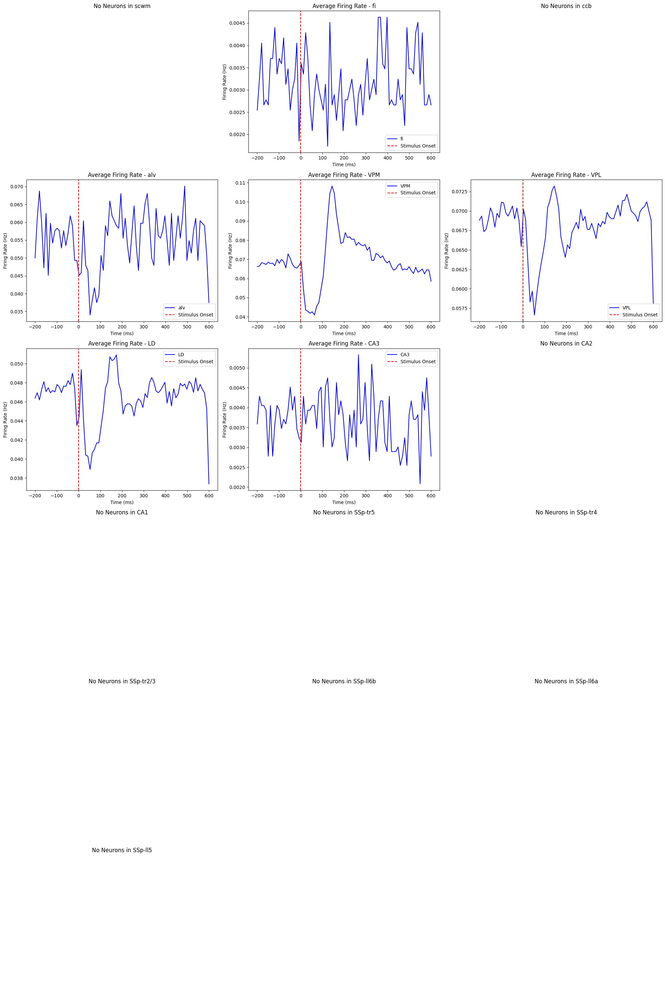

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Load data
df_stim = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/meta_stim')
df_probeB_spikes = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/probeB_spikes')
meta_units = pd.read_pickle('activdata/srg/zap_zip/mouse569068/estim_vis_2021-03-04_10-51-38/meta_units').loc['probeB']
neuron_regions = meta_units['area']

# Define depth order of brain regions
depth_order = ['SSp-ll5', 'SSp-ll6a', 'SSp-ll6b', 'SSp-tr2/3', 'SSp-tr4', 'SSp-tr5', 
               'CA1', 'CA2', 'CA3', 'LD', 'VPL', 'VPM', 'alv', 'ccb', 'fi', 'scwm'][::-1]

# Convert region labels to categorical data using depth order and sort neurons
region_sorted = pd.Categorical(neuron_regions, categories=depth_order, ordered=True)
region_sorted_indices = np.argsort(region_sorted.codes)

# Define time window, bin size, and bins for analysis
window_start, window_end, bin_size = -200, 600, 10
num_bins = int((window_end - window_start) / bin_size)
time_bins = np.linspace(window_start, window_end, num_bins)

# Filter for 'biphasic' stimuli and get parameters and sweeps
df_biphasic = df_stim[df_stim['stim_type'] == 'biphasic']
parameters = np.sort(df_biphasic['parameter'].unique())
sweeps = np.sort(df_biphasic['sweep'].unique())
sweep_labels = {0: 'Awake', 1: 'ISO', 2: 'Recovery 1', 3: 'Recovery 2'}


# Map region names to neuron indices
region_indices = {region: np.where(region_sorted == region)[0] for region in depth_order}

# Set up the plot layout dynamically based on the number of regions
num_regions = len(depth_order)
num_cols = 3  # Number of columns in the grid
num_rows = int(np.ceil(num_regions / num_cols))  # Number of rows required
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))
axes = axes.flatten()

# Loop through each region and calculate average firing rates
for idx, region in enumerate(depth_order):
    ax = axes[idx]
    
    # Get neurons belonging to this region
    neuron_indices = region_indices[region]
    region_firing_rates = []  # Store average responses of all neurons in the region
    
    # Iterate through neurons in this region
    for neuron_idx in neuron_indices:
        if neuron_idx < len(df_probeB_spikes.columns):
            # Get spike times for the neuron
            spike_times = df_probeB_spikes.index[df_probeB_spikes.iloc[:, neuron_idx]]
            neuron_responses = []
            
            # Calculate responses for each stimulus
            for _, stim_row in df_biphasic.iterrows():
                onset_time = stim_row['onset']
                bins = np.arange(onset_time + window_start / 1000, onset_time + window_end / 1000, bin_size / 1000)
                binned_spikes, _ = np.histogram(spike_times, bins=bins)
                
                # Pad or truncate spikes to match the expected number of bins
                binned_spikes = np.pad(binned_spikes, (0, num_bins - len(binned_spikes)), 'constant') if len(binned_spikes) < num_bins else binned_spikes[:num_bins]
                neuron_responses.append(binned_spikes)
            
            neuron_responses = np.array(neuron_responses)
            if neuron_responses.size > 0:
                average_response = np.mean(neuron_responses, axis=0)  # Average across stimuli
                region_firing_rates.append(average_response)
    
    # Calculate average firing rate curve for the region
    if region_firing_rates:
        region_avg_curve = np.mean(region_firing_rates, axis=0)
        time_axis = np.linspace(window_start, window_end, num_bins)  # Create time axis
        
        # Plot average curve
        ax.plot(time_axis, region_avg_curve, label=f'{region}', color='blue')
        ax.axvline(0, color='red', linestyle='--', label='Stimulus Onset')
        ax.set_title(f'Average Firing Rate - {region}', fontsize=12)
        ax.set_xlabel('Time (ms)')
        ax.set_ylabel('Firing Rate (Hz)')
        ax.legend()
    else:
        ax.set_title(f'No Neurons in {region}', fontsize=12)
        ax.axis('off')  # Hide axes for empty regions

# Hide any extra subplots if the grid is larger than the number of regions
for extra_ax in axes[len(depth_order):]:
    extra_ax.axis('off')

plt.tight_layout()
plt.show()






In [12]:
# Calculate the number of neurons in each region
neuron_count_by_region = neuron_regions.value_counts()

# Display the result
print(neuron_count_by_region)


area
LD           111
VPL           95
CA3           59
SSp-ll6a      47
SSp-tr2/3     29
SSp-tr4       24
VPM           20
scwm          19
SSp-ll5       12
CA2           12
SSp-ll6b      11
SSp-tr5        9
CA1            8
alv            7
fi             6
ccb            5
Name: count, dtype: int64


In [15]:
# Ensure neuron IDs are in the index of `meta_units` and map regions to spike data
df_probeB_spikes['neuron_region'] = df_probeB_spikes.index.map(meta_units['area'])

# Check the mapping
print(df_probeB_spikes[['neuron_region']].head())

# Calculate the number of neurons in each region
neuron_count_by_region = neuron_regions.value_counts()
print(neuron_count_by_region)

# Check if all regions in meta_units are represented in spike data
regions_in_spikes = df_probeB_spikes['neuron_region'].unique()
missing_regions = set(neuron_count_by_region.index) - set(regions_in_spikes)
print(f"Regions missing in spike data: {missing_regions}")


units neuron_region
time               
3.483           NaN
3.484           NaN
3.485           NaN
3.486           NaN
3.487           NaN
area
LD           111
VPL           95
CA3           59
SSp-ll6a      47
SSp-tr2/3     29
SSp-tr4       24
VPM           20
scwm          19
SSp-ll5       12
CA2           12
SSp-ll6b      11
SSp-tr5        9
CA1            8
alv            7
fi             6
ccb            5
Name: count, dtype: int64
Regions missing in spike data: set()


In [16]:
# Check the first few neuron IDs from df_probeD_spikes
print(f"Neuron IDs in df_probeD_spikes:\n{df_probeB_spikes.index[:10]}")

# Check the neuron-region mapping in meta_units
print(f"Neuron regions in meta_units:\n{meta_units['area'].head()}")

# Ensure that the neuron IDs in df_probeD_spikes exist in meta_units
missing_neurons = set(df_probeB_spikes.index) - set(meta_units.index)
print(f"Missing Neurons in meta_units: {missing_neurons}")

# Check the mapping of neuron IDs to regions
df_probeB_spikes['neuron_region'] = df_probeB_spikes.index.map(meta_units['area'])
print(f"Neuron region mapping:\n{df_probeB_spikes['neuron_region'].head()}")


Neuron IDs in df_probeD_spikes:
Index([3.483, 3.484, 3.485, 3.486, 3.487, 3.488, 3.489, 3.49, 3.491, 3.492], dtype='float64', name='time')
Neuron regions in meta_units:
cluster_id
0    VPM
1    VPM
2    VPM
3    VPM
4    VPM
Name: area, dtype: object


IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Neuron region mapping:
time
3.483    NaN
3.484    NaN
3.485    NaN
3.486    NaN
3.487    NaN
Name: neuron_region, dtype: object


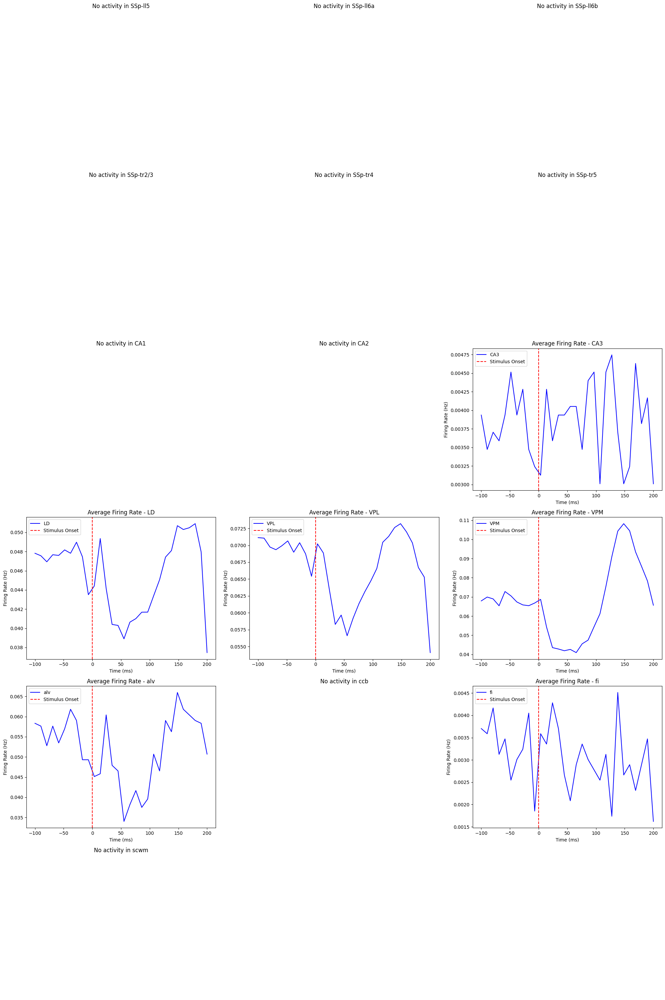

In [7]:
import numpy as np
import matplotlib.pyplot as plt

# Constants
window_start = -100  # Start of the time window (ms)
window_end = 200     # End of the time window (ms)
bin_size = 10        # Bin size (ms)
num_bins = int((window_end - window_start) / bin_size)
depth_order = ['SSp-ll5', 'SSp-ll6a', 'SSp-ll6b', 'SSp-tr2/3', 'SSp-tr4', 'SSp-tr5',
               'CA1', 'CA2', 'CA3', 'LD', 'VPL', 'VPM', 'alv', 'ccb', 'fi', 'scwm']

# Map region names to neuron indices
region_indices = {region: np.where(region_sorted == region)[0] for region in depth_order}

# Plotting setup
num_regions = len(depth_order)
num_cols = 3  # Number of columns
num_rows = int(np.ceil(num_regions / num_cols))  # Number of rows
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))
axes = axes.flatten()

# Loop through each region
for idx, region in enumerate(depth_order):
    ax = axes[idx]
    neuron_indices = region_indices[region]
    region_firing_rates = []
    
    # Check if the region has neurons
    if len(neuron_indices) > 0:
        for neuron_idx in neuron_indices:
            if neuron_idx < len(df_probeB_spikes.columns):
                # Extract spike times
                spike_times = df_probeB_spikes.index[df_probeB_spikes.iloc[:, neuron_idx]]
                neuron_responses = []
                
                for _, stim_row in df_biphasic.iterrows():
                    onset_time = stim_row['onset']
                    bins = np.arange(onset_time + window_start / 1000, onset_time + window_end / 1000, bin_size / 1000)
                    binned_spikes, _ = np.histogram(spike_times, bins=bins)
                    binned_spikes = np.pad(binned_spikes, (0, num_bins - len(binned_spikes)), 'constant') if len(binned_spikes) < num_bins else binned_spikes[:num_bins]
                    neuron_responses.append(binned_spikes)
                
                if len(neuron_responses) > 0:
                    neuron_avg_response = np.mean(neuron_responses, axis=0)
                    region_firing_rates.append(neuron_avg_response)
        
        # Average firing rate for the region
        if len(region_firing_rates) > 0:
            region_avg_curve = np.mean(region_firing_rates, axis=0)
            time_axis = np.linspace(window_start, window_end, num_bins)
            ax.plot(time_axis, region_avg_curve, label=f'{region}', color='blue')
            ax.axvline(0, color='red', linestyle='--', label='Stimulus Onset')
            ax.set_title(f'Average Firing Rate - {region}', fontsize=12)
            ax.set_xlabel('Time (ms)')
            ax.set_ylabel('Firing Rate (Hz)')
            ax.legend()
        else:
            # No valid firing rates
            ax.set_title(f'No activity in {region}', fontsize=12)
            ax.axis('off')
    else:
        # No neurons in this region
        ax.set_title(f'No neurons in {region}', fontsize=12)
        ax.axis('off')

# Hide extra subplots
for extra_ax in axes[len(depth_order):]:
    extra_ax.axis('off')

plt.tight_layout()
plt.show()


No data for sweep 0, parameter 10
No data for sweep 0, parameter 20
No data for sweep 0, parameter 40


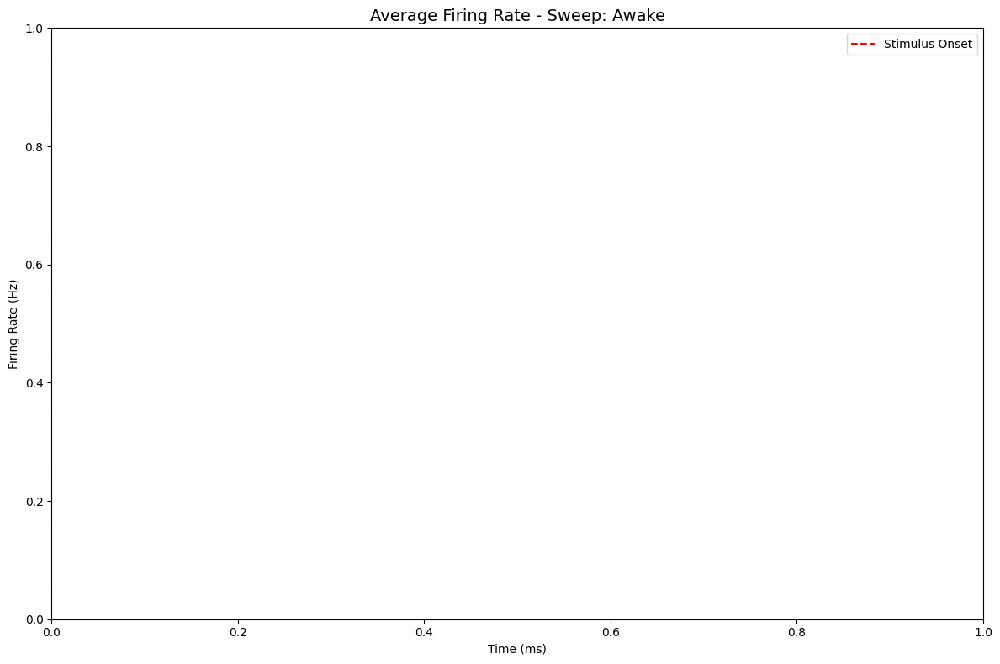

No data for sweep 1, parameter 10
No data for sweep 1, parameter 20
No data for sweep 1, parameter 40


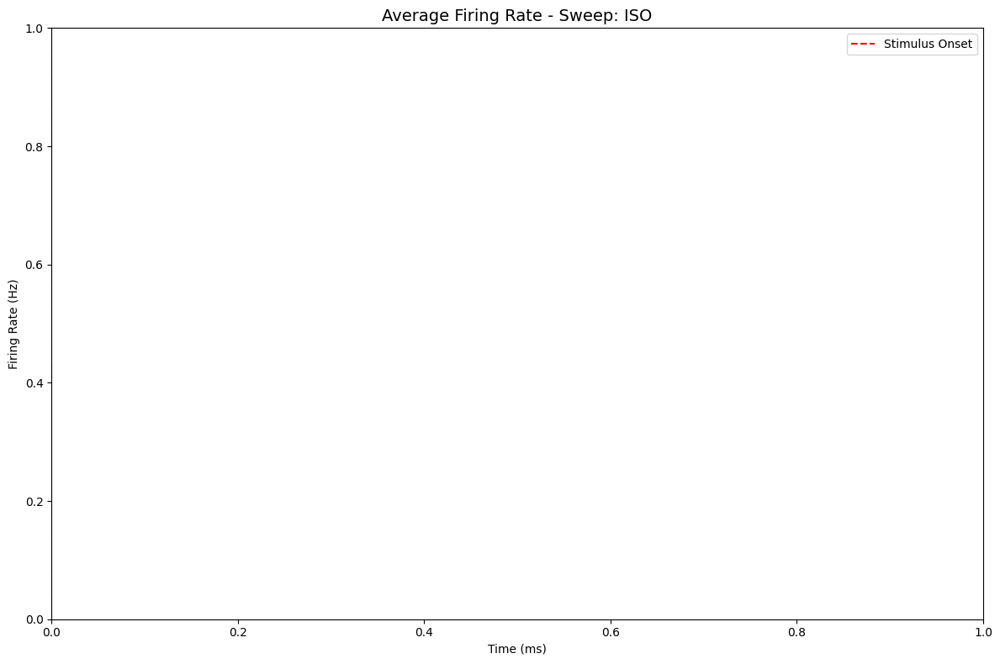

No data for sweep 2, parameter 10
No data for sweep 2, parameter 20
No data for sweep 2, parameter 40


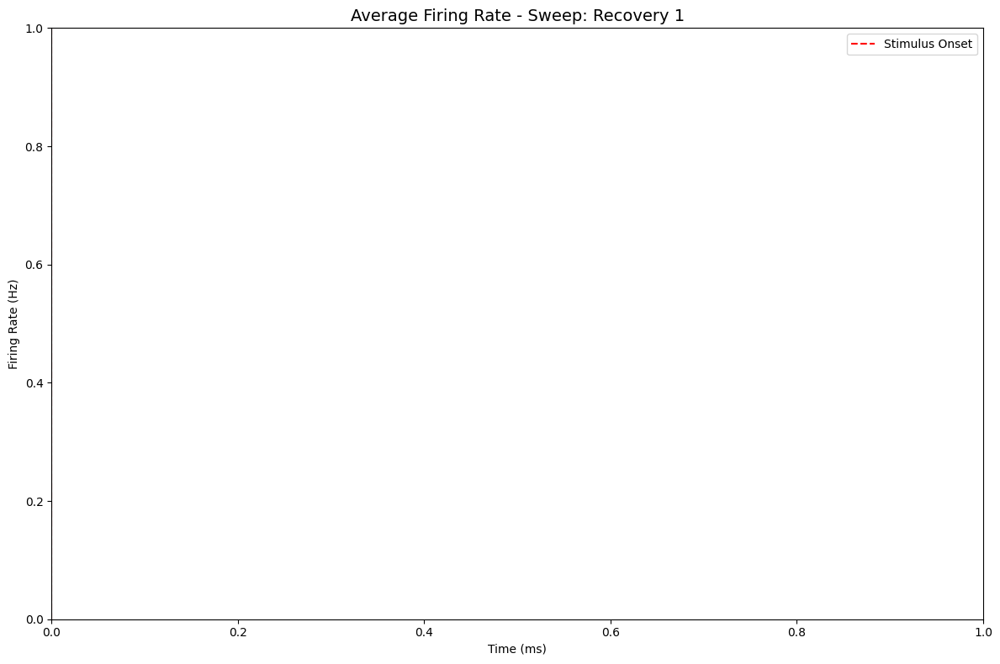

No data for sweep 3, parameter 10
No data for sweep 3, parameter 20
No data for sweep 3, parameter 40


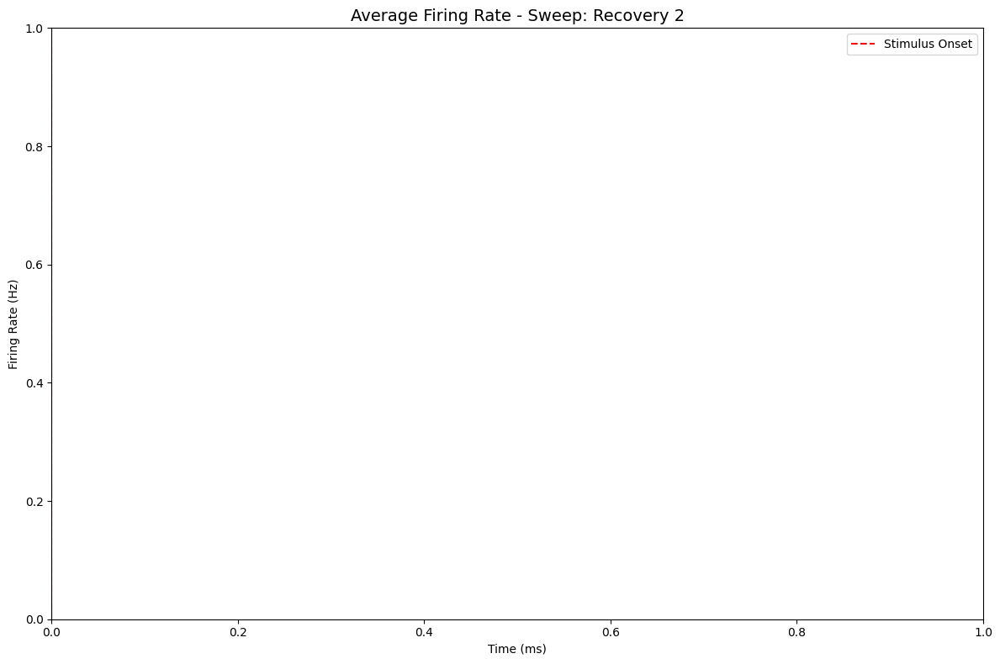

In [5]:
# Constants
window_start = -100  # Start of the time window (ms)
window_end = 200     # End of the time window (ms)
bin_size = 10        # Bin size (ms)
num_bins = int((window_end - window_start) / bin_size)
sweeps = [0, 1, 2, 3]  # Sweep labels (Awake, ISO, Recovery 1, Recovery 2)
parameters = [10, 20, 40]  # Example parameter values in your data

# Plotting
for sweep in sweeps:
    fig, ax = plt.subplots(figsize=(12, 8))
    for parameter in parameters:
        # Filter the biphasic stimuli for this sweep and parameter
        stim_subset = df_biphasic[(df_biphasic['sweep'] == sweep) & 
                                  (df_biphasic['parameter'] == parameter)]
        
        if stim_subset.empty:
            print(f"No data for sweep {sweep}, parameter {parameter}")
            continue
        
        region_curves = []
        for region in depth_order:
            neuron_indices = np.where(region_sorted == region)[0]
            region_responses = []
            
            for neuron_idx in neuron_indices:
                if neuron_idx < len(df_probeB_spikes.columns):
                    # Extract spike times
                    spike_times = df_probeB_spikes.index[df_probeB_spikes.iloc[:, neuron_idx]]
                    
                    # Calculate responses for each stimulus in the subset
                    for _, stim_row in stim_subset.iterrows():
                        onset_time = stim_row['onset']
                        bins = np.arange(onset_time + window_start / 1000, 
                                         onset_time + window_end / 1000, 
                                         bin_size / 1000)
                        binned_spikes, _ = np.histogram(spike_times, bins=bins)
                        binned_spikes = np.pad(binned_spikes, (0, num_bins - len(binned_spikes)), 'constant') if len(binned_spikes) < num_bins else binned_spikes[:num_bins]
                        region_responses.append(binned_spikes)
            
            # Calculate region average curve
            if len(region_responses) > 0:
                region_avg_response = np.mean(region_responses, axis=0)
                region_curves.append(region_avg_response)
        
        # Compute average firing rate for this parameter
        if len(region_curves) > 0:
            parameter_avg_curve = np.mean(region_curves, axis=0)
            time_axis = np.linspace(window_start, window_end, num_bins)
            ax.plot(time_axis, parameter_avg_curve, label=f'Parameter {parameter}')
    
    # Customize plot
    sweep_label = ['Awake', 'ISO', 'Recovery 1', 'Recovery 2'][sweep]
    ax.axvline(0, color='red', linestyle='--', label='Stimulus Onset')
    ax.set_title(f'Average Firing Rate - Sweep: {sweep_label}', fontsize=14)
    ax.set_xlabel('Time (ms)')
    ax.set_ylabel('Firing Rate (Hz)')
    ax.legend()
    plt.tight_layout()
    plt.show()
